In [5]:
import numpy as np
import matplotlib.pyplot as plt
import scipy
%matplotlib notebook

%load_ext autoreload
%autoreload 2

import caffe
from heatmaps import *
from optimize_mask import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [6]:
gpu = 0
net_type = 'googlenet'

caffe.set_device(gpu)
caffe.set_mode_gpu()
net = get_net(net_type)
net_transformer = get_ILSVRC_net_transformer(net)

labels_desc = np.loadtxt('/home/ruthfong/packages/caffe/data/ilsvrc12/synset_words.txt', str, delimiter='\t')
synsets = np.loadtxt('/home/ruthfong/packages/caffe/data/ilsvrc12/synsets.txt', str, delimiter='\t')
(paths, labels) = read_imdb('/home/ruthfong/packages/caffe/data/ilsvrc12/annotated_train_heldout_imdb.txt')
paths = np.array(paths)
labels = np.array(labels)

<IPython.core.display.Javascript object>


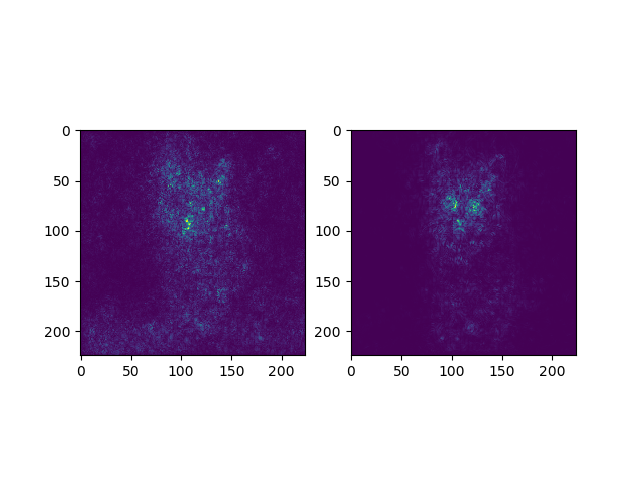

In [3]:
path = '/home/ruthfong/packages/caffe/examples/images/cat.jpg'
label = 281 # tabby cat

sal_heatmap = compute_heatmap(net, net_transformer, path, label, 'saliency', 'loss3/classifier', 'loss3/classifier')
guided_heatmap = compute_heatmap(net, net_transformer, path, label, 'guided_backprop', 'loss3/classifier', 'loss3/classifier')

f, ax = plt.subplots(1,2)
ax[0].imshow(sal_heatmap)
ax[1].imshow(guided_heatmap)
plt.show()

In [23]:
def calculate_mass_center(heatmap):
    if not isinstance(heatmap, np.ndarray):
        heatmap = np.array(heatmap)
    assert(len(heatmap.shape) == 2)
    x_idx = np.arange(heatmap.shape[1])
    y_idx = np.arange(heatmap.shape[0])
    tot_mass = heatmap.sum()
    x_center = (heatmap.sum(0) * x_idx).sum() / float(tot_mass)
    y_center = (heatmap.sum(1) * y_idx).sum() / float(tot_mass)

    return (x_center, y_center)

113.464883788 113.982251538
114.811822942 96.2507729145


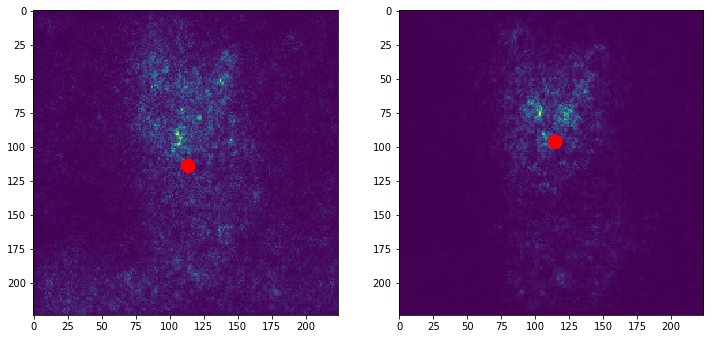

In [28]:
(x_sal, y_sal) = calculate_mass_center(sal_heatmap)
(x_guided, y_guided) = calculate_mass_center(guided_heatmap)

print x_sal, y_sal
print x_guided, y_guided

f, ax = plt.subplots(1,2)
ax[0].imshow(sal_heatmap)
circ_sal = plt.Circle((x_sal, y_sal), 5, color='r')
ax[0].add_artist(circ_sal)
ax[1].imshow(guided_heatmap)
circ_guided = plt.Circle((x_guided, y_guided), 5, color='r')
ax[1].add_artist(circ_guided)
plt.show()

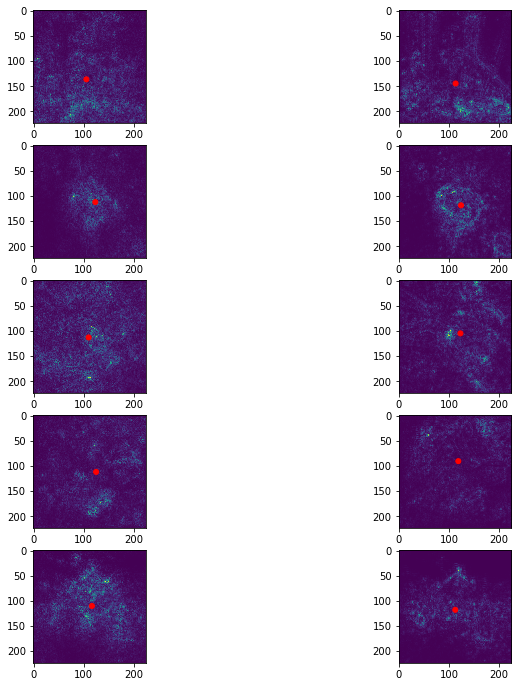

In [25]:
pylab.rcParams['figure.figsize'] = (12.0, 12.0)
f, ax = plt.subplots(5, 2)
for i in range(5):
    sal_heatmap = compute_heatmap(net, net_transformer, paths[i], labels[i], 'saliency', 'loss3/classifier', 'loss3/classifier')
    guided_heatmap = compute_heatmap(net, net_transformer, paths[i], labels[i], 'guided_backprop', 'loss3/classifier', 'loss3/classifier')

    (x_sal, y_sal) = calculate_mass_center(sal_heatmap)
    (x_guided, y_guided) = calculate_mass_center(guided_heatmap)

    ax[i][0].imshow(sal_heatmap)
    circ_sal = plt.Circle((x_sal, y_sal), 5, color='r')
    ax[i][0].add_artist(circ_sal)
    ax[i][1].imshow(guided_heatmap)
    circ_guided = plt.Circle((x_guided, y_guided), 5, color='r')
    ax[i][1].add_artist(circ_guided)
    #print x_sal, y_sal
    #print x_guided, y_guided

plt.show()

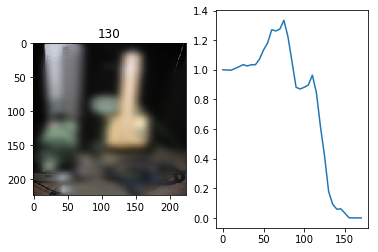

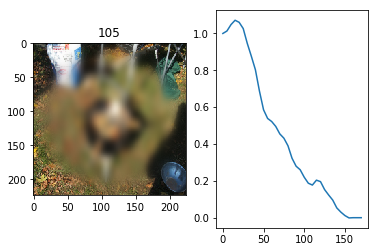

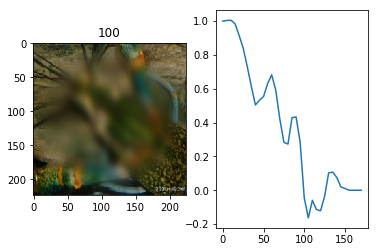

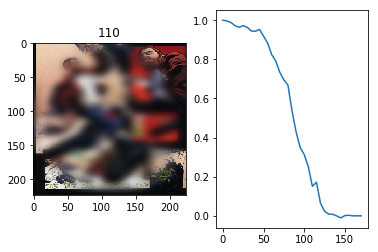

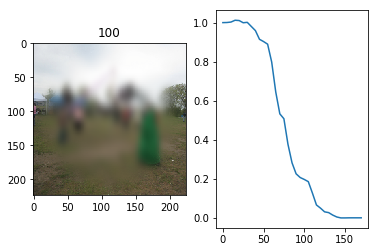

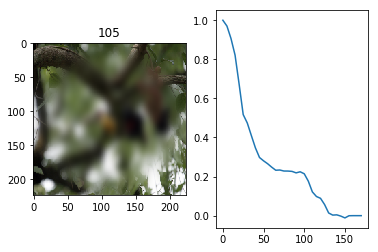

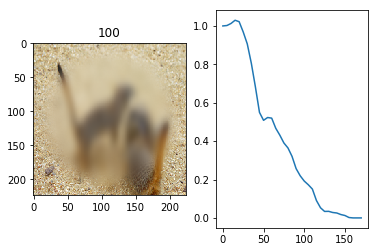

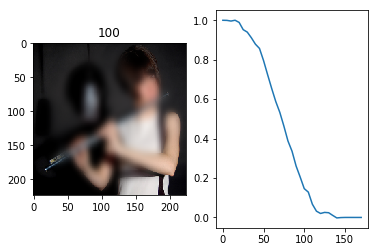

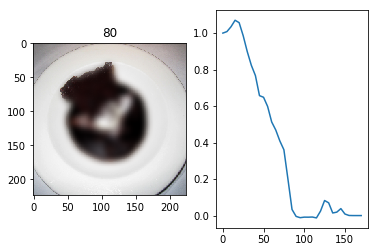

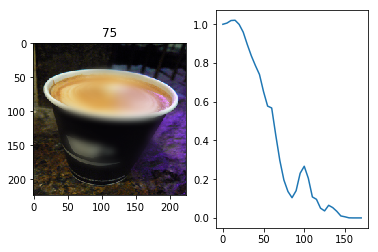

In [82]:
%matplotlib inline
for i in range(10):
    test_circular_masks(net, paths[i], labels[i], end_layer = 'loss3/classifier', thres = 0.2)

In [ ]:
for i in range(10):
    test_circular_masks(net, paths[i], labels[i])

<IPython.core.display.Javascript object>


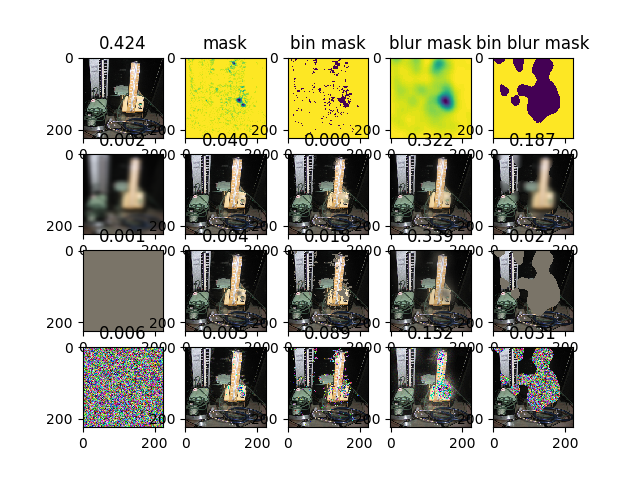

<IPython.core.display.Javascript object>


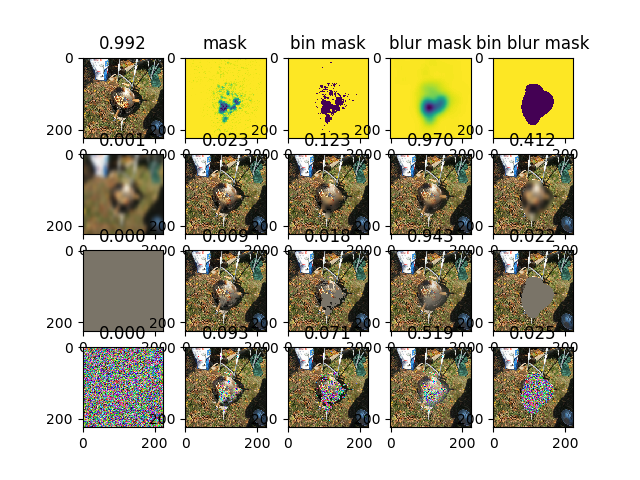

<IPython.core.display.Javascript object>


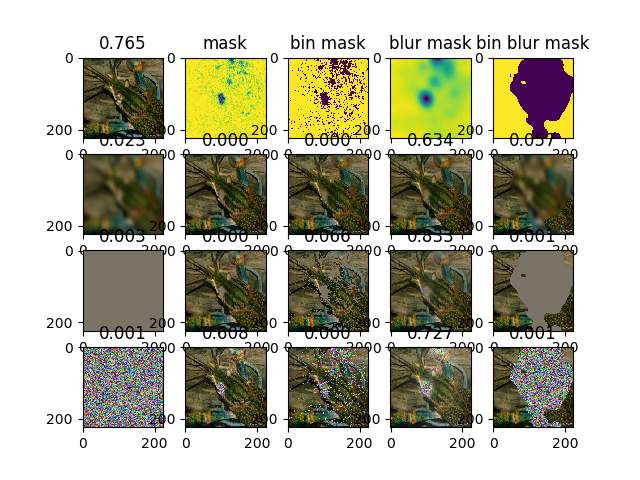

<IPython.core.display.Javascript object>


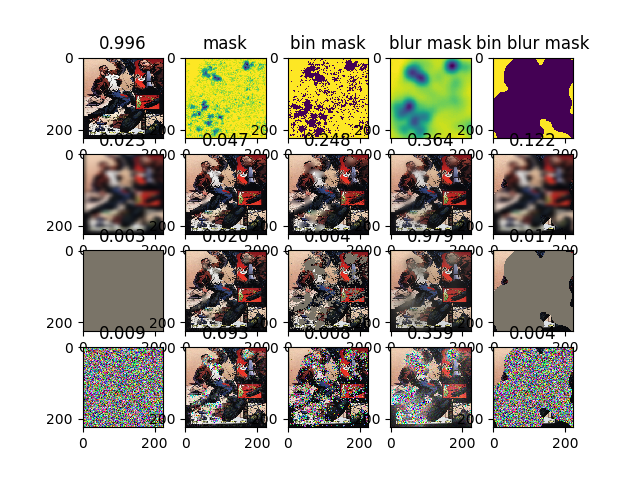

<IPython.core.display.Javascript object>


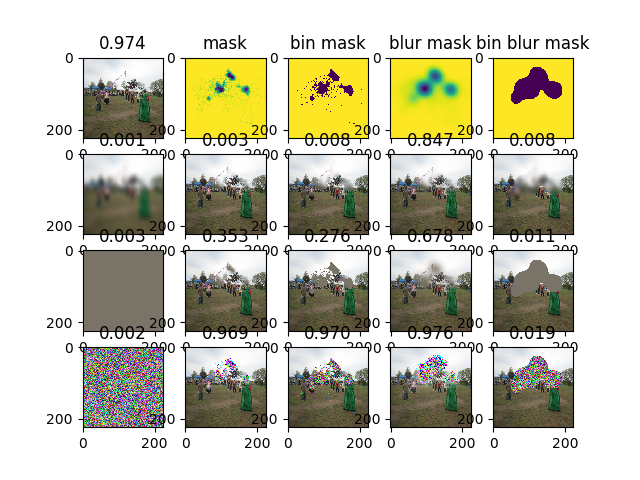

<IPython.core.display.Javascript object>


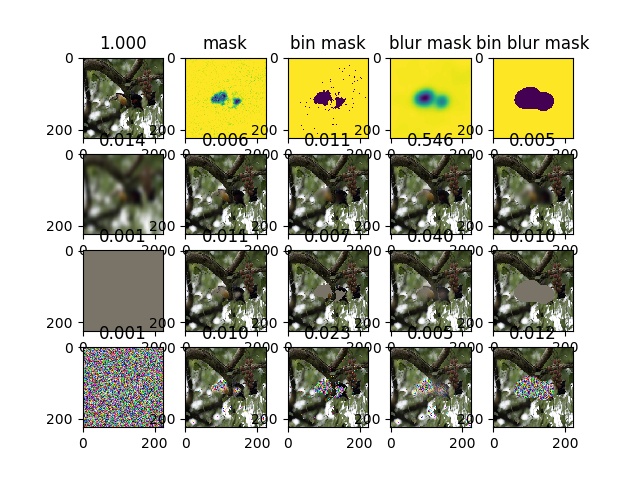

<IPython.core.display.Javascript object>


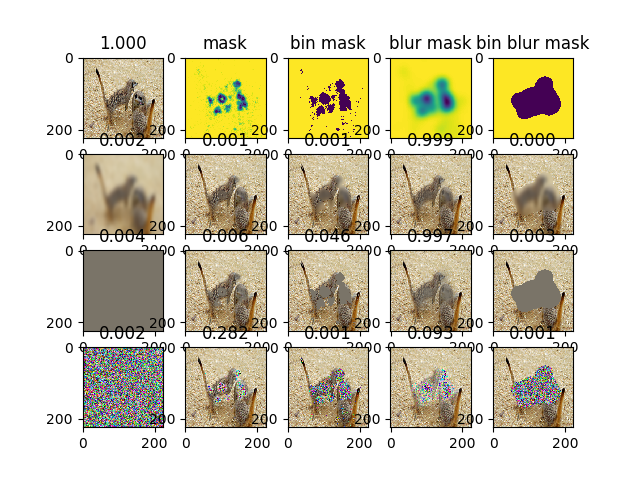

<IPython.core.display.Javascript object>


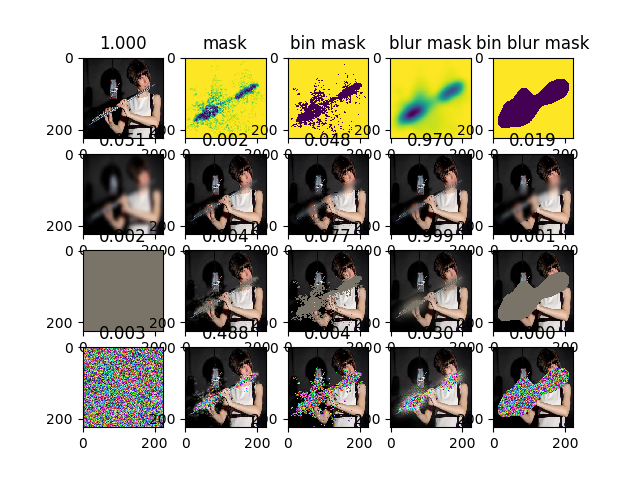

<IPython.core.display.Javascript object>


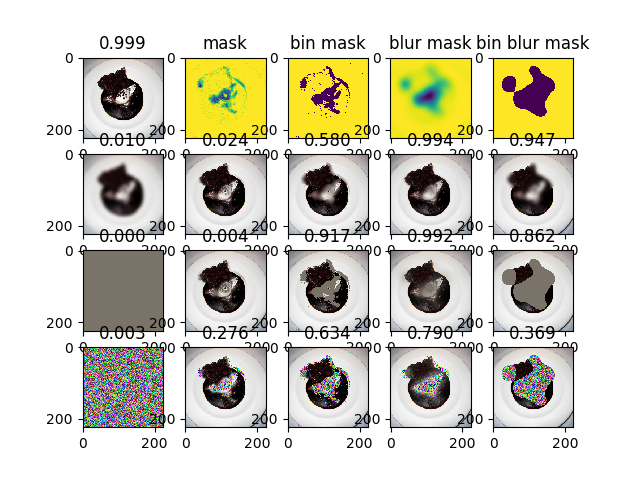

<IPython.core.display.Javascript object>


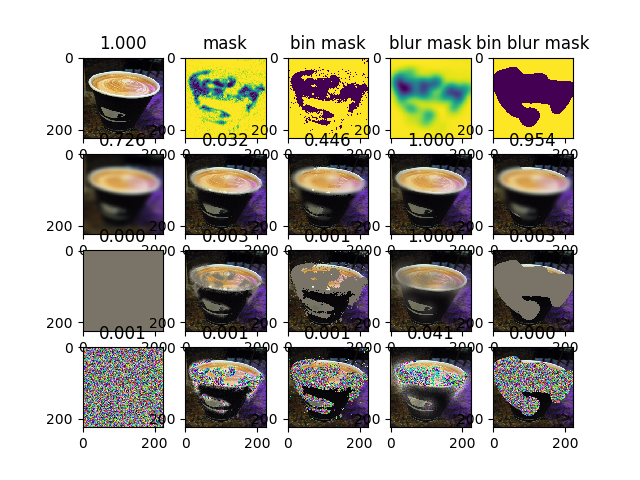

In [4]:
res_dir = '/data/ruthfong/neural_coding/pycaffe_results'
mask_rel_dir = 'googlenet_train_heldout_given_grad_1_norm_0/min_top5_prob_blur/lr_-1.00_l1_lambda_-4.00_tv_lambda_-inf_l1_lambda_2_-2.00_beta_3.00_mask_scale_1_blur_mask_0_jitter_4_noise_-inf_num_iters_300_tv2_mask_init/'
mask_paths = [os.path.join(res_dir, mask_rel_dir, x) for x in os.listdir(os.path.join(res_dir, mask_rel_dir))]
num_top = 5
transformer = get_ILSVRC_net_transformer(net)
for i in range(10):
    img = transformer.preprocess('data', caffe.io.load_image(paths[i]))
    scores = forward_pass(net, img)
    sorted_idx = np.argsort(scores)
    target = np.zeros(scores.shape)
    target[sorted_idx[:-(num_top+1):-1]] = 1
    fig_path = os.path.join('/data/ruthfong/neural_coding/sanity_checks', mask_rel_dir, '%d.png' % i)
    check_mask_generalizability(net, paths[i], target, mask_paths[i], last_layer = 'prob', fig_path = fig_path)
    #plt.close()

In [5]:
res_dir = '/data/ruthfong/neural_coding/pycaffe_results'
mask_rel_dir = 'googlenet_train_heldout_given_grad_1_norm_0/min_top5_prob_avg_blur_blank_noise/lr_-1.00_l1_lambda_-4.00_tv_lambda_-inf_l1_lambda_2_-2.00_beta_3.00_mask_scale_1_blur_mask_0_jitter_4_noise_-inf_num_iters_300_tv2_mask_init/'
mask_paths = [os.path.join(res_dir, mask_rel_dir, x) for x in os.listdir(os.path.join(res_dir, mask_rel_dir))]
num_top = 5
transformer = get_ILSVRC_net_transformer(net)
for i in range(100):
    img = transformer.preprocess('data', caffe.io.load_image(paths[i]))
    scores = forward_pass(net, img)
    sorted_idx = np.argsort(scores)
    target = np.zeros(scores.shape)
    target[sorted_idx[:-(num_top+1):-1]] = 1
    fig_path = os.path.join('/data/ruthfong/neural_coding/sanity_checks', mask_rel_dir, '%d.png' % i)
    check_mask_generalizability(net, paths[i], target, mask_paths[i], last_layer = 'prob', fig_path = fig_path)
    #plt.close()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

IndexError: list index out of range

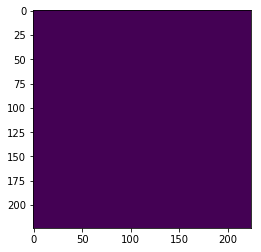

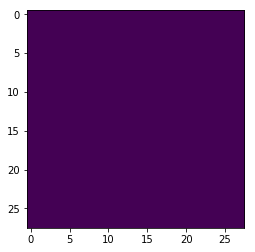

0.0 0.0 1.0 1.0


In [19]:
%matplotlib inline

#mask = 1-create_blurred_circular_mask((224,224), 90)
mask = np.ones((224,224))
mask_r = scipy.misc.imresize(mask, (28,28), 'nearest')/float(255)
#mask_r = resize(mask, 8, diff = True)
plt.imshow(mask)
plt.show()
plt.imshow(mask_r)
plt.show()
print mask_r.min(), mask_r.max(), mask.min(), mask.max()

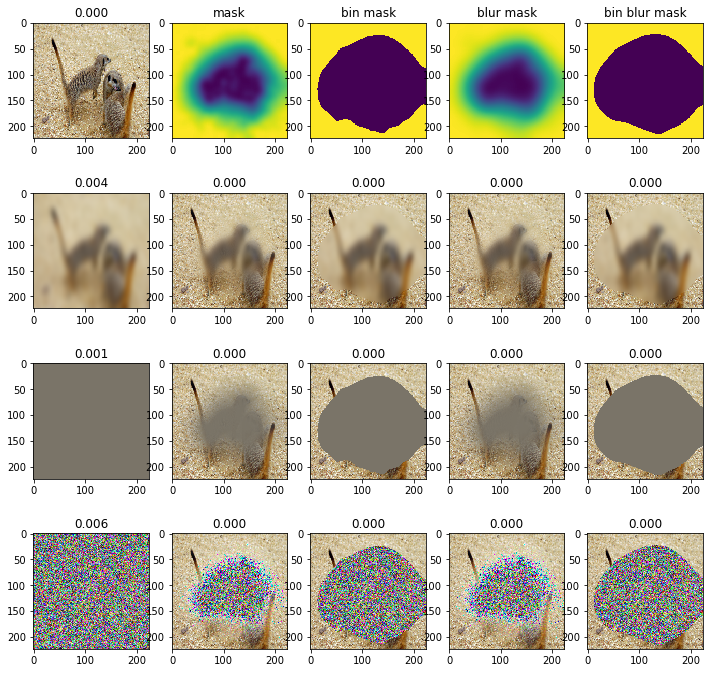

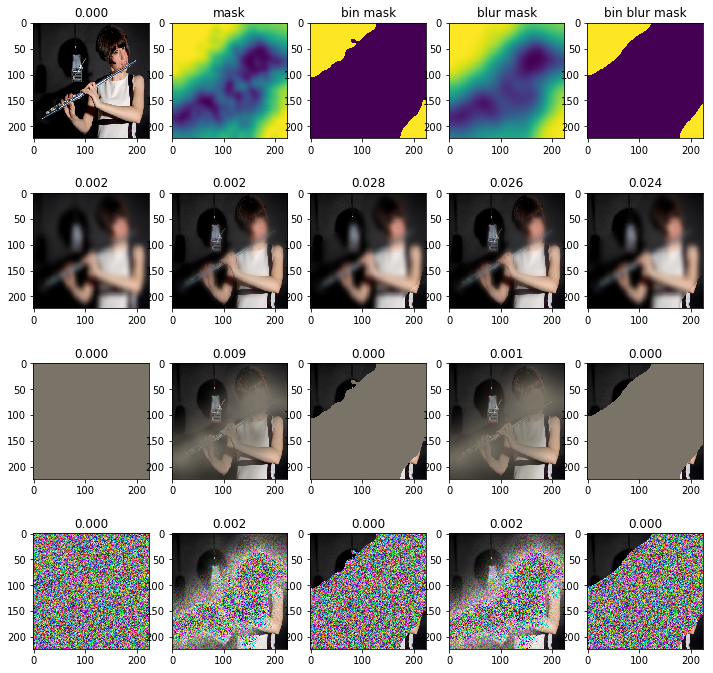

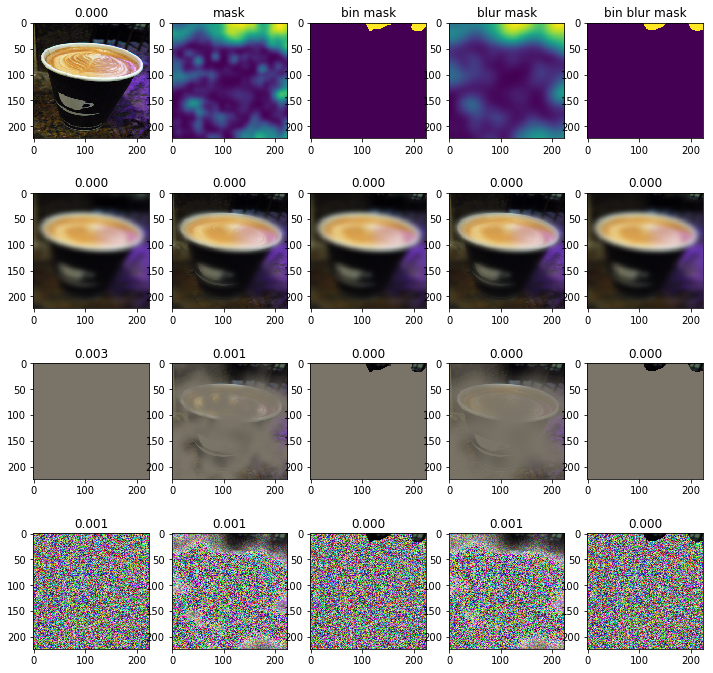

In [56]:
mask_rel_dir = 'googlenet_train_heldout_given_grad_1_norm_0/min_top5_prob_blur/lr_-1.00_l1_lambda_-4.00_tv_lambda_-inf_l1_lambda_2_-2.00_beta_3.00_mask_scale_8_blur_mask_5_jitter_4_noise_-inf_num_iters_300_tv2_mask_init'
%matplotlib inline
res_dir = '/data/ruthfong/neural_coding/pycaffe_results'
#mask_rel_dir ='googlenet_train_heldout_given_grad_1_norm_0/min_top5_prob_blur/lr_-1.00_l1_lambda_-4.00_tv_lambda_-inf_l1_lambda_2_-2.00_beta_3.00_mask_scale_8_blur_mask_5_jitter_4_noise_-inf_num_iters_300_tv2_mask_init_full'
#mask_rel_dir = 'googlenet_train_heldout_given_grad_1_norm_0/min_top5_prob_blur/lr_-1.00_l1_lambda_-4.00_tv_lambda_-inf_l1_lambda_2_-2.00_beta_3.00_mask_scale_1_blur_mask_0_jitter_4_noise_-inf_num_iters_300_tv2_mask_init/'
mask_paths = [os.path.join(res_dir, mask_rel_dir, x) for x in os.listdir(os.path.join(res_dir, mask_rel_dir))]
num_top = 5
transformer = get_ILSVRC_net_transformer(net)
pylab.rcParams['figure.figsize'] = (12,12)
idx = [6,7,9]
for i in range(len(idx)):
    img = transformer.preprocess('data', caffe.io.load_image(paths[i]))
    scores = forward_pass(net, img)
    sorted_idx = np.argsort(scores)
    target = np.zeros(scores.shape)
    target[sorted_idx[:-(num_top+1):-1]] = 1
    fig_path = os.path.join('/data/ruthfong/neural_coding/sanity_checks', mask_rel_dir, '%d.png' % i)
    check_mask_generalizability(net, paths[idx[i]], target, mask_paths[i], last_layer = 'prob', fig_path = fig_path)
    #plt.close()

In [51]:
output = np.squeeze(forward_pass(net, net_transformer.preprocess('data', caffe.io.load_image(paths[6])), target = None, last_layer = 'prob'))
max_i = np.argmax(output)
print '%.2f %s' % (output[max_i], labels_desc[max_i])

0.92 n02138441 meerkat, mierkat


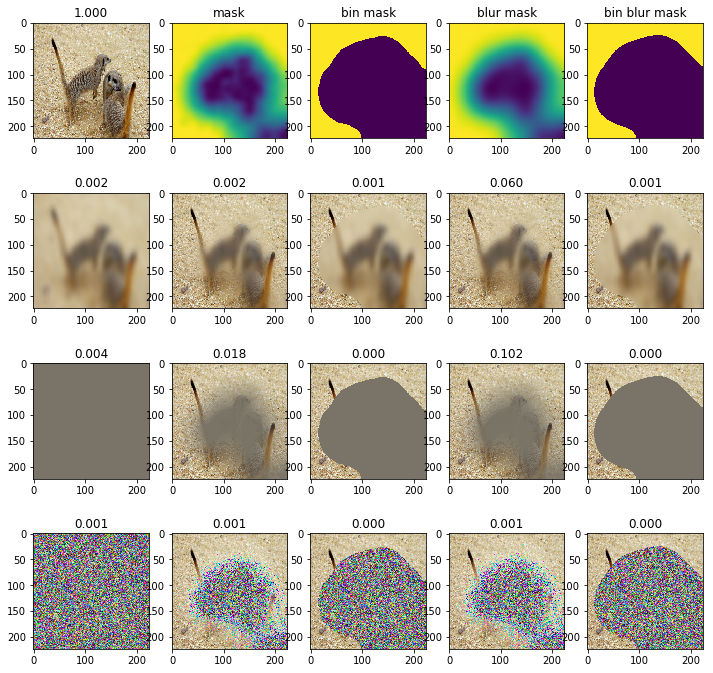

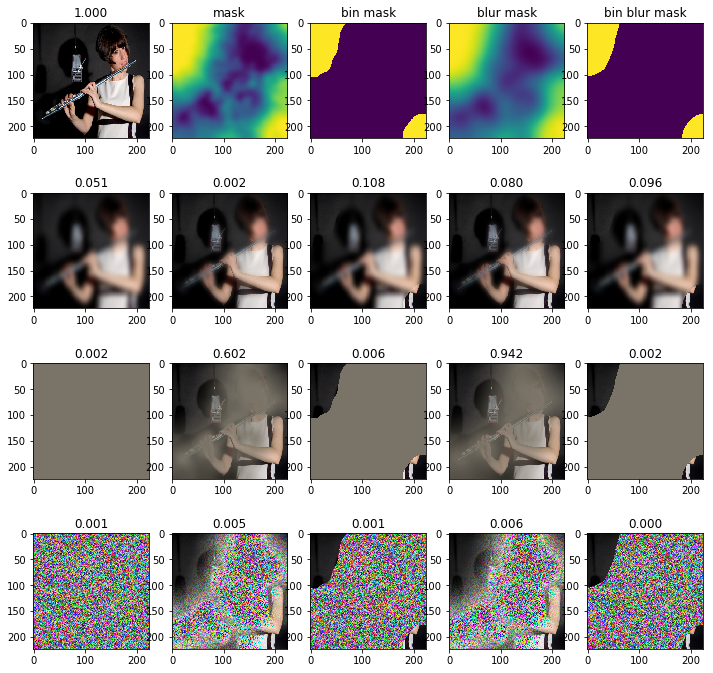

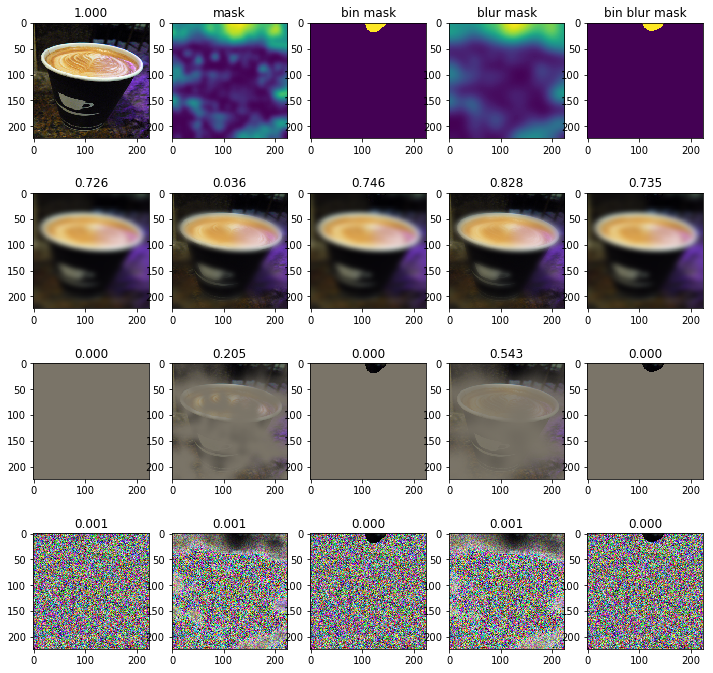

In [62]:
%matplotlib inline
import optimize_mask
reload(optimize_mask)
from optimize_mask import *

res_dir = '/data/ruthfong/neural_coding/pycaffe_results'
mask_rel_dir ='googlenet_train_heldout_given_grad_1_norm_0/min_top5_prob_blur/lr_-1.00_l1_lambda_-4.00_tv_lambda_-inf_l1_lambda_2_-2.00_beta_3.00_mask_scale_8_blur_mask_5_jitter_4_noise_-inf_num_iters_300_tv2_mask_init_full'
#mask_rel_dir = 'googlenet_train_heldout_given_grad_1_norm_0/min_top5_prob_blur/lr_-1.00_l1_lambda_-4.00_tv_lambda_-inf_l1_lambda_2_-2.00_beta_3.00_mask_scale_1_blur_mask_0_jitter_4_noise_-inf_num_iters_300_tv2_mask_init/'
mask_paths = [os.path.join(res_dir, mask_rel_dir, x) for x in os.listdir(os.path.join(res_dir, mask_rel_dir))]
num_top = 5
transformer = get_ILSVRC_net_transformer(net)
pylab.rcParams['figure.figsize'] = (12,12)
idx = [6,7,9]
for i in range(len(idx)):
    img = transformer.preprocess('data', caffe.io.load_image(paths[idx[i]]))
    scores = forward_pass(net, img)
    sorted_idx = np.argsort(scores)
    target = np.zeros(scores.shape)
    target[sorted_idx[:-(num_top+1):-1]] = 1
    fig_path = os.path.join('/data/ruthfong/neural_coding/sanity_checks', mask_rel_dir, '%d.png' % i)
    check_mask_generalizability(net, paths[idx[i]], target, mask_paths[i], last_layer = 'prob', fig_path = fig_path)
    #plt.close()

/home/ruthfong/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:56: RuntimeWarning: divide by zero encountered in log10
/home/ruthfong/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:58: RuntimeWarning: divide by zero encountered in log10


<IPython.core.display.Javascript object>


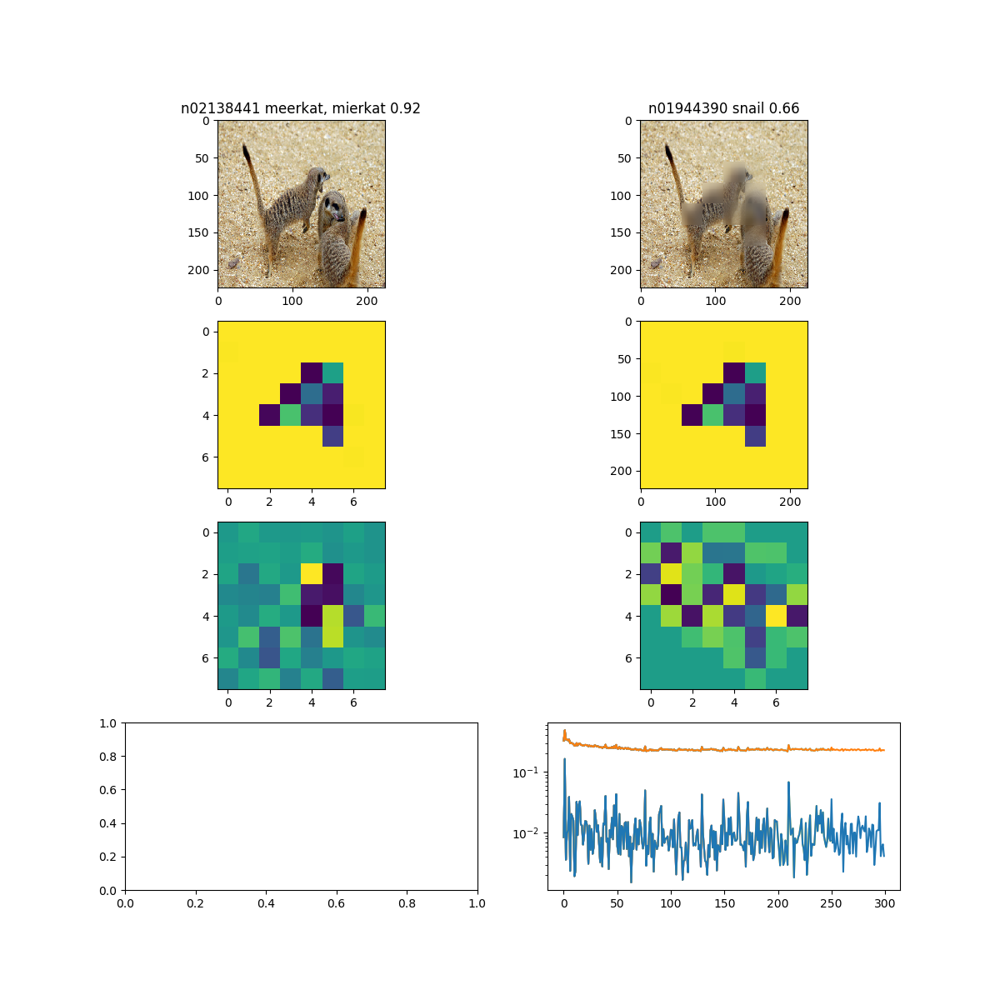

saved mask to /data/ruthfong/neural_coding/pycaffe_results/googlenet_train_heldout_given_grad_1_norm_simple_0/min_top0_prob_blur/lr_-1.00_l1_lambda_-2.00_tv_lambda_-inf_l1_lambda_2_-2.00_beta_1.00_mask_scale_28_blur_mask_0_jitter_4_noise_-inf_num_iters_300_tv2_mask_init/6.npy


<IPython.core.display.Javascript object>


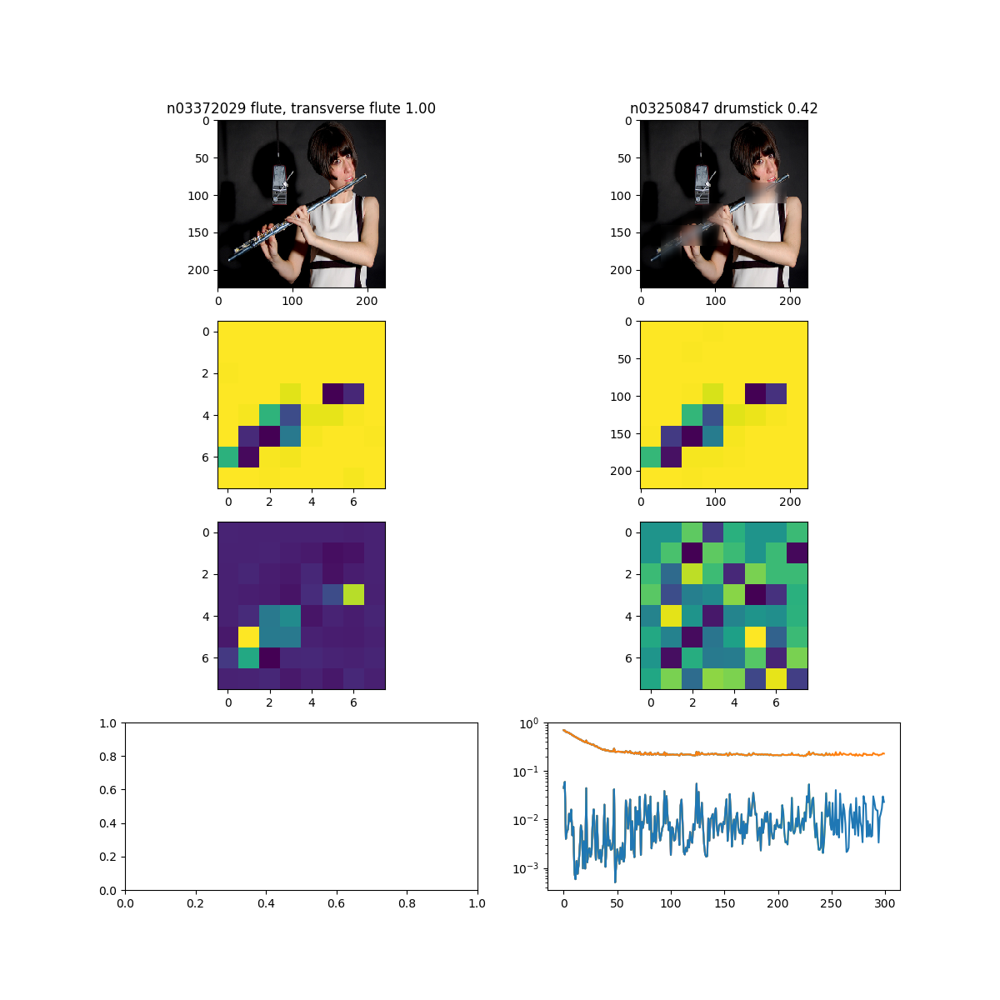

saved mask to /data/ruthfong/neural_coding/pycaffe_results/googlenet_train_heldout_given_grad_1_norm_simple_0/min_top0_prob_blur/lr_-1.00_l1_lambda_-2.00_tv_lambda_-inf_l1_lambda_2_-2.00_beta_1.00_mask_scale_28_blur_mask_0_jitter_4_noise_-inf_num_iters_300_tv2_mask_init/7.npy


<IPython.core.display.Javascript object>


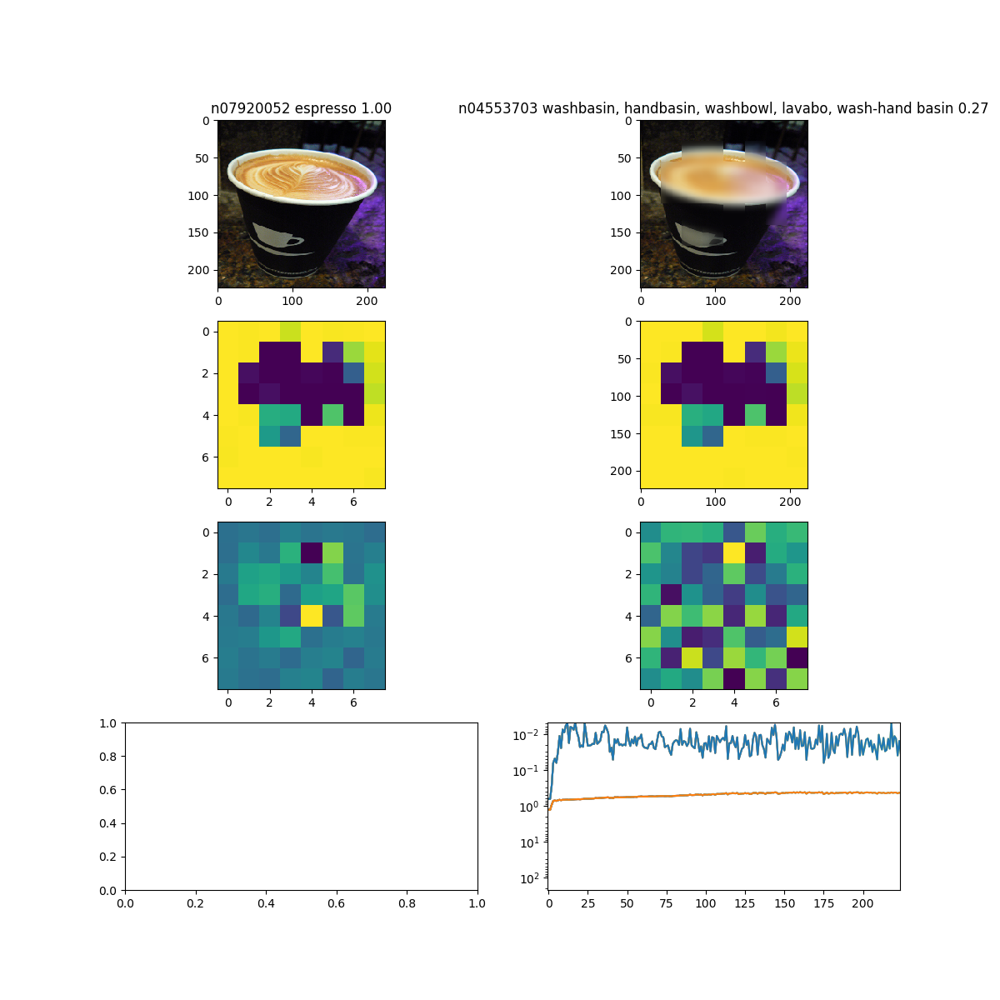

saved mask to /data/ruthfong/neural_coding/pycaffe_results/googlenet_train_heldout_given_grad_1_norm_simple_0/min_top0_prob_blur/lr_-1.00_l1_lambda_-2.00_tv_lambda_-inf_l1_lambda_2_-2.00_beta_1.00_mask_scale_28_blur_mask_0_jitter_4_noise_-inf_num_iters_300_tv2_mask_init/9.npy


In [15]:
%matplotlib notebook

import optimize_mask
reload(optimize_mask)
from optimize_mask import *
data_desc = 'train_heldout'

num_iters = 300
lr = 1e-1
l1_lambda = 1e-2
l1_ideal = 1
l1_lambda_2 = 0
tv_lambda = 1e-2
tv_beta = 1
jitter = 4
num_top = 0
noise = 0
null_type = 'blur'
given_gradient = True
norm_score = False
end_layer = 'prob'
use_conv_norm = False
blur_mask = 0
mask_scale = 28
#mask_init = None

for i in [6,7,9]:
    net = get_net(net_type)
    net_transformer = get_ILSVRC_net_transformer(net)

    path = paths[i]
    img = net_transformer.preprocess('data', caffe.io.load_image(path))
    net.blobs['data'].data[...] = img
    net.forward()
    scores = np.squeeze(net.blobs['prob'].data)
    sorted_idx = np.argsort(scores)
    if given_gradient:
        target = np.zeros(scores.shape)
        if num_top == 0:
            target[labels[i]] = 1
        else:
            target[sorted_idx[:-(num_top+1):-1]] = 1
    else:
        if num_top == 0:
            target = np.array([labels[i]])
        else:
            target = sorted_idx[:-(num_top+1):-1]

    mask_radius = test_circular_masks(net, paths[i], labels[i], plot = False, end_layer = end_layer, thres = 1e-2)
    mask_init = 1-create_blurred_circular_mask((net.blobs['data'].data.shape[2], net.blobs['data'].data.shape[3]), 
                                            mask_radius, center = None, sigma = 10)
    #mask_init = np.zeros((net.blobs['data'].data.shape[2], net.blobs['data'].data.shape[3]))
    fig_path = None
    if i < 100:
        fig_path = os.path.join('/data/ruthfong/neural_coding/pycaffe_figs/%s_%s_given_grad_%d_norm_simple_%d/min_top%d_prob_%s/lr_%.2f_l1_lambda_%.2f_l1_lambda2_%.2f_tv_lambda_%.2f_beta_%.2f_mask_scale_%d_blur_mask_%d_jitter_%d_noise_%.1f_num_iters_%d_tv2_mask_init/%d.png' % (
            net_type, data_desc, int(given_gradient), int(norm_score), num_top, null_type, np.log10(lr), np.log10(l1_lambda), np.log10(l1_lambda_2), np.log10(tv_lambda), tv_beta, mask_scale, blur_mask, jitter, np.log10(noise), num_iters, i))
    mask_path = os.path.join('/data/ruthfong/neural_coding/pycaffe_results/%s_%s_given_grad_%d_norm_simple_%d/min_top%d_prob_%s/lr_%.2f_l1_lambda_%.2f_tv_lambda_%.2f_l1_lambda_2_%.2f_beta_%.2f_mask_scale_%d_blur_mask_%d_jitter_%d_noise_%.1f_num_iters_%d_tv2_mask_init/%d.npy' % (
        net_type, data_desc, int(given_gradient), int(norm_score), num_top, null_type, np.log10(lr), np.log10(l1_lambda), np.log10(l1_lambda_2), np.log10(tv_lambda), tv_beta, mask_scale, blur_mask, jitter, np.log10(noise), num_iters, i))


    #if os.path.exists(mask_path):
    #   print '%s already exists so skipping' % mask_path
    #   continue

    
    optimize_mask(net, path, target, labels = labels_desc, given_gradient = given_gradient, norm_score = norm_score,
                        num_iters = num_iters, lr = lr, l1_lambda = l1_lambda, l1_ideal = 1,
                        l1_lambda_2 = l1_lambda_2, tv_lambda = tv_lambda, tv_beta = tv_beta, mask_scale = mask_scale,
                        use_conv_norm= use_conv_norm, blur_mask = blur_mask, jitter = jitter,
                        null_type = null_type, mask_init = mask_init, gpu = gpu, start_layer = None, end_layer = end_layer,
                        plot_step = 50, debug = False, fig_path = fig_path, mask_path = mask_path)

[[ 1.      1.      1.      1.      1.      1.      1.      1.    ]
 [ 0.9961  1.      1.      1.      1.      0.9961  1.      1.    ]
 [ 1.      1.      0.9961  1.      0.      0.5647  1.      0.9961]
 [ 1.      1.      0.9961  0.      0.3569  0.0824  1.      1.    ]
 [ 1.      0.9961  0.0196  0.7098  0.1333  0.      0.9922  1.    ]
 [ 1.      1.      1.      0.9961  1.      0.1843  1.      1.    ]
 [ 1.      1.      1.      1.      1.      1.      0.9961  1.    ]
 [ 1.      1.      1.      1.      1.      1.      1.      1.    ]]


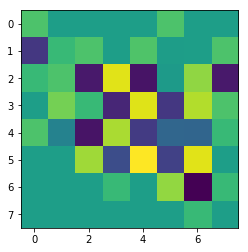

In [49]:
%matplotlib inline
#mask = np.load('/data/ruthfong/neural_coding/pycaffe_results/googlenet_train_heldout_given_grad_1_norm_simple_0/min_top0_prob_blur/lr_-1.00_l1_lambda_-2.00_tv_lambda_-inf_l1_lambda_2_-2.00_beta_1.00_mask_scale_28_blur_mask_0_jitter_4_noise_-inf_num_iters_300_tv2_mask_init/6.npy')
#mask = scipy.misc.imresize(mask, (8,8), 'nearest')/float(255)
mask = np.loadtxt('mask.txt')
print mask
#plt.imshow(mask)
#plt.show()
np.savetxt('mask.txt', mask, fmt='%.4f')
[err, dtv] = tv(mask, beta = 1)
np.savetxt('dtv.txt', dtv, fmt='%.4f')
#plt.imshow(dtv)
#plt.show()
dtv_m = np.loadtxt('dtv.txt').reshape((8,8))
plt.imshow(dtv_m)
plt.show()
diff = dtv - dtv_m
#plt.imshow(dtv - dtv_m)
#plt.show()
#print diff.max(), diff.min(), dtv.max(), dtv_m.max()

/home/ruthfong/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:48: RuntimeWarning: divide by zero encountered in log10
/home/ruthfong/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:50: RuntimeWarning: divide by zero encountered in log10


<IPython.core.display.Javascript object>


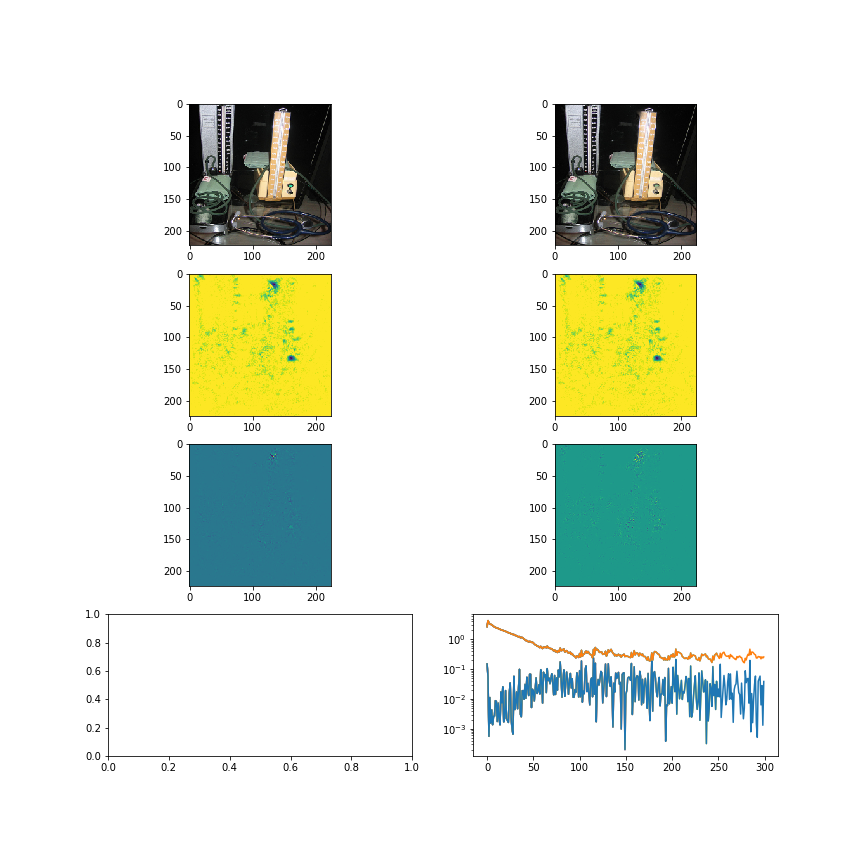

saved mask to /data/ruthfong/neural_coding/pycaffe_results/googlenet_train_heldout_given_grad_1_norm_0/min_top5_prob_avg_blur_blank_noise/lr_-1.00_l1_lambda_-4.00_tv_lambda_-inf_l1_lambda_2_-2.00_beta_3.00_mask_scale_1_blur_mask_0_jitter_4_noise_-inf_num_iters_300_tv2_mask_init/0.npy


<IPython.core.display.Javascript object>


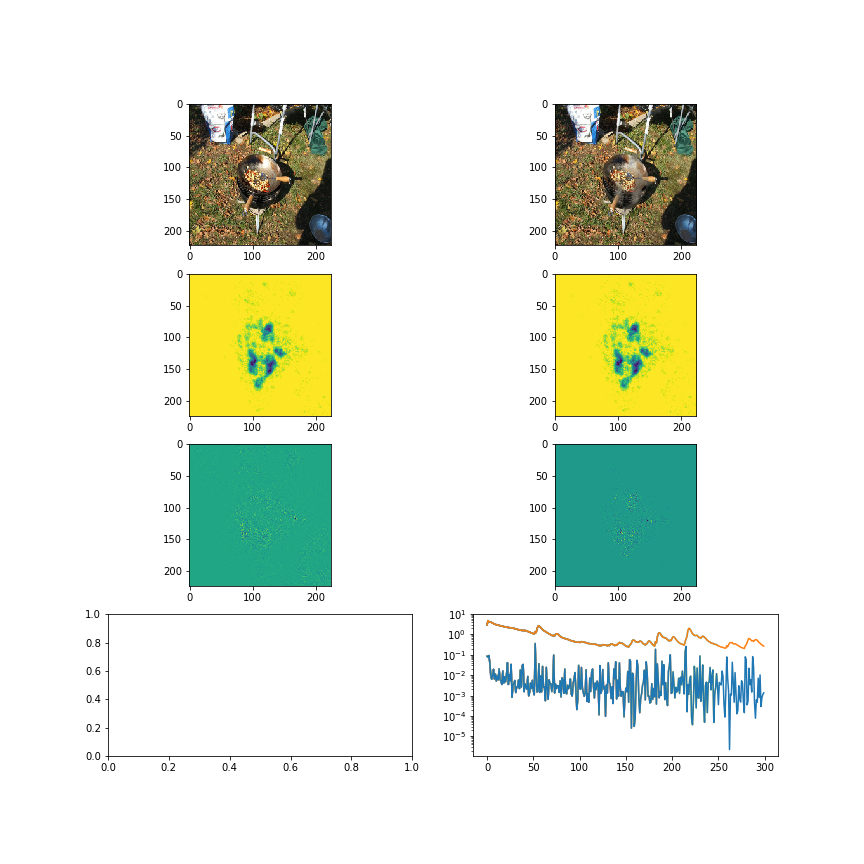

saved mask to /data/ruthfong/neural_coding/pycaffe_results/googlenet_train_heldout_given_grad_1_norm_0/min_top5_prob_avg_blur_blank_noise/lr_-1.00_l1_lambda_-4.00_tv_lambda_-inf_l1_lambda_2_-2.00_beta_3.00_mask_scale_1_blur_mask_0_jitter_4_noise_-inf_num_iters_300_tv2_mask_init/1.npy


<IPython.core.display.Javascript object>


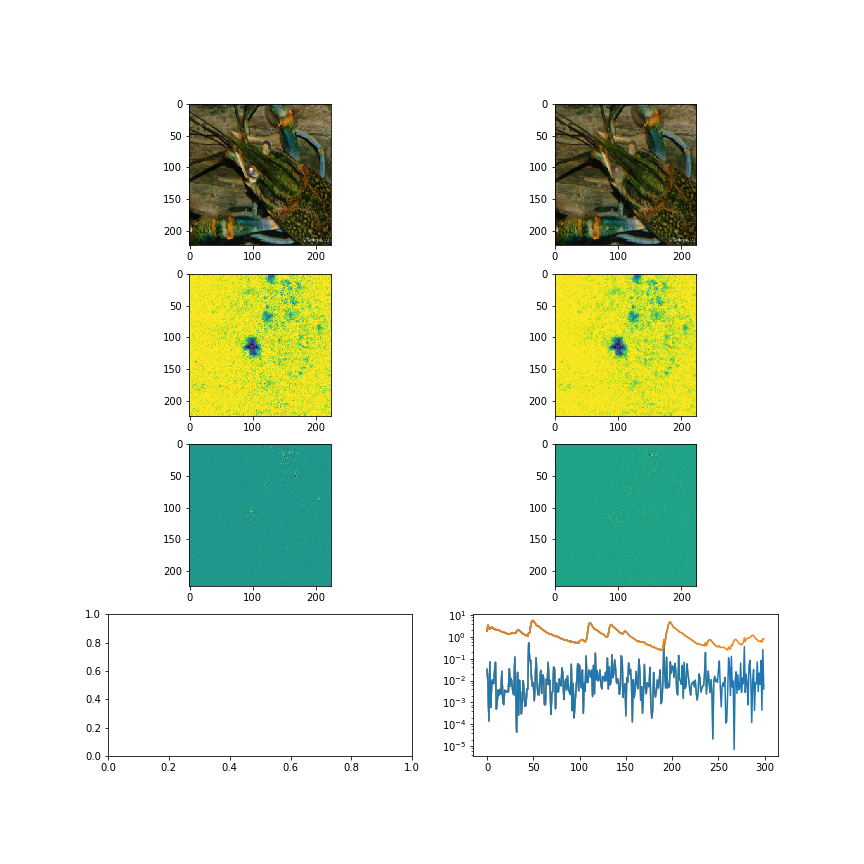

saved mask to /data/ruthfong/neural_coding/pycaffe_results/googlenet_train_heldout_given_grad_1_norm_0/min_top5_prob_avg_blur_blank_noise/lr_-1.00_l1_lambda_-4.00_tv_lambda_-inf_l1_lambda_2_-2.00_beta_3.00_mask_scale_1_blur_mask_0_jitter_4_noise_-inf_num_iters_300_tv2_mask_init/2.npy


<IPython.core.display.Javascript object>


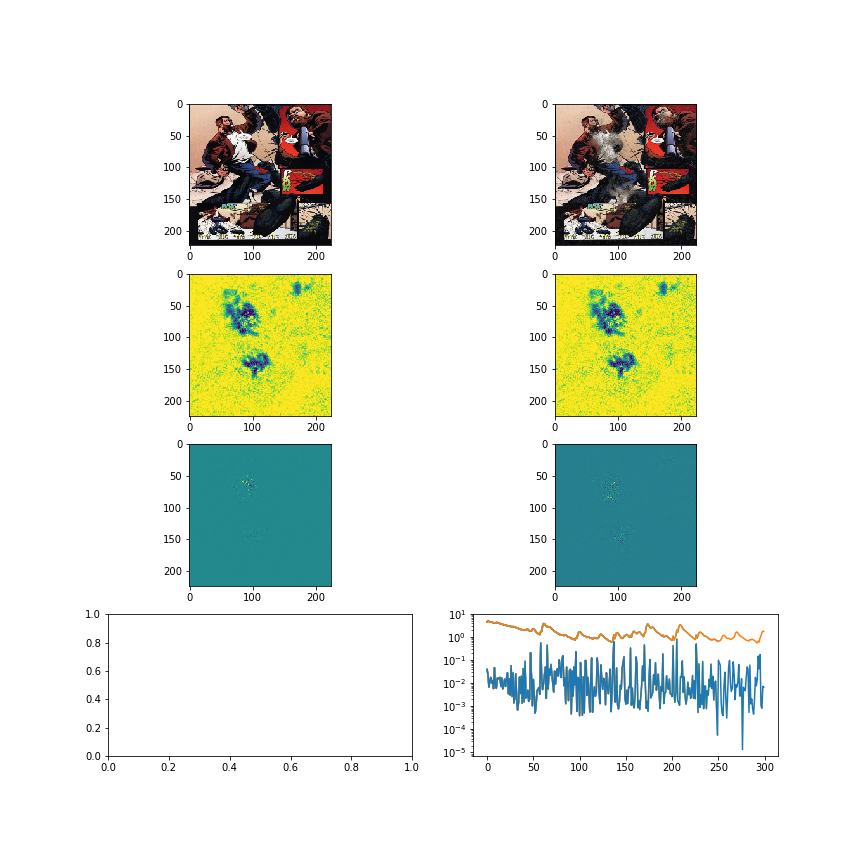

saved mask to /data/ruthfong/neural_coding/pycaffe_results/googlenet_train_heldout_given_grad_1_norm_0/min_top5_prob_avg_blur_blank_noise/lr_-1.00_l1_lambda_-4.00_tv_lambda_-inf_l1_lambda_2_-2.00_beta_3.00_mask_scale_1_blur_mask_0_jitter_4_noise_-inf_num_iters_300_tv2_mask_init/3.npy


<IPython.core.display.Javascript object>


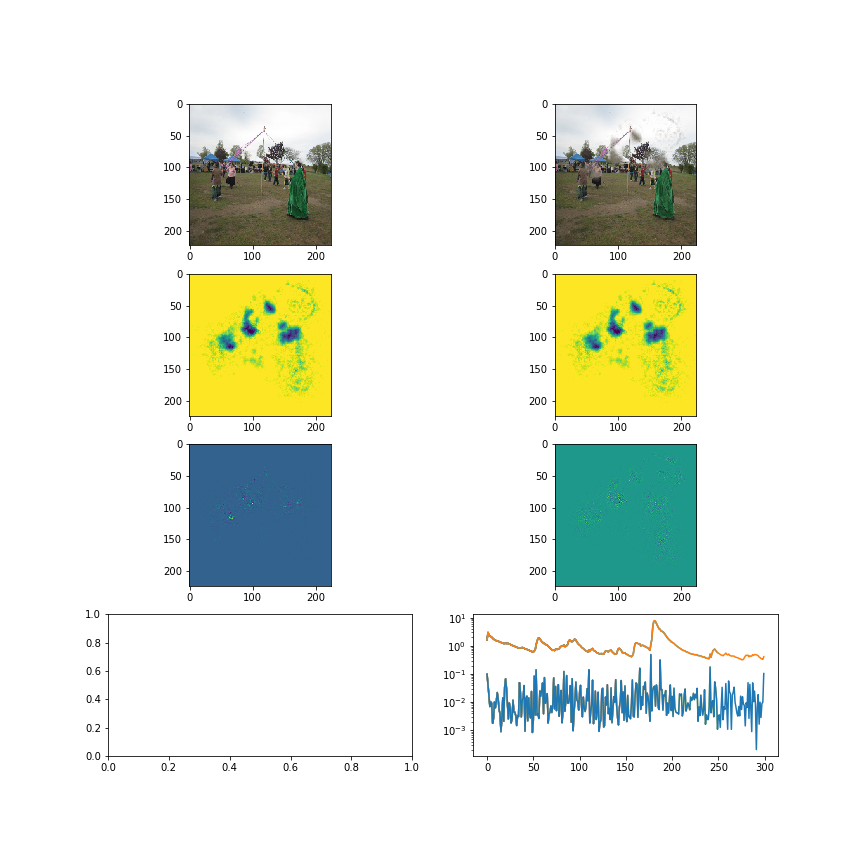

saved mask to /data/ruthfong/neural_coding/pycaffe_results/googlenet_train_heldout_given_grad_1_norm_0/min_top5_prob_avg_blur_blank_noise/lr_-1.00_l1_lambda_-4.00_tv_lambda_-inf_l1_lambda_2_-2.00_beta_3.00_mask_scale_1_blur_mask_0_jitter_4_noise_-inf_num_iters_300_tv2_mask_init/4.npy


<IPython.core.display.Javascript object>


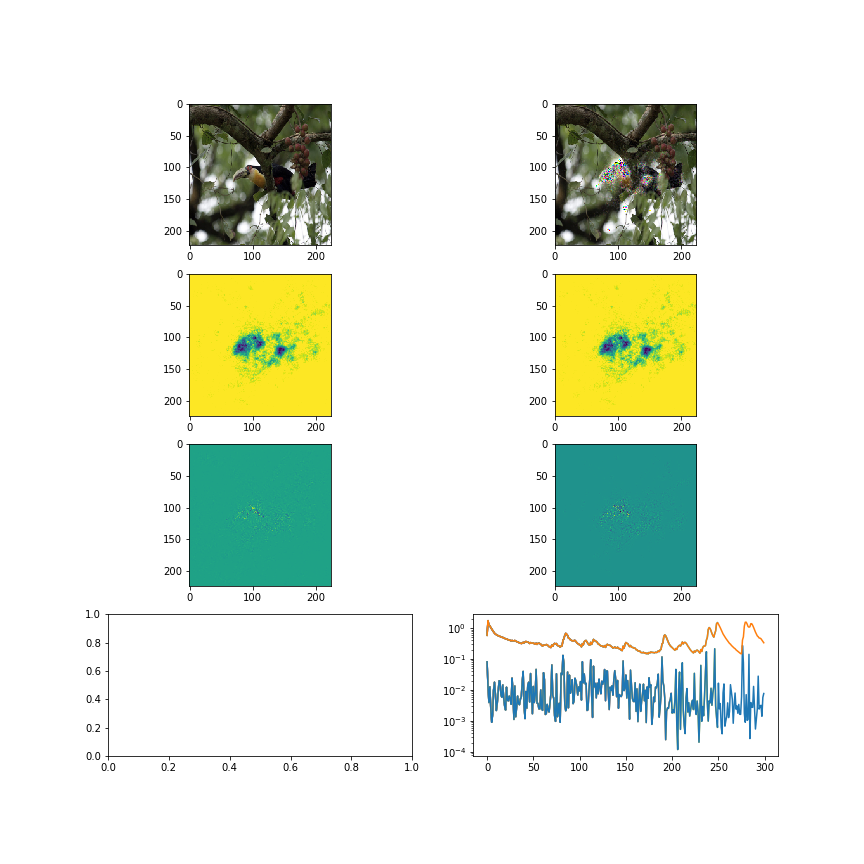

saved mask to /data/ruthfong/neural_coding/pycaffe_results/googlenet_train_heldout_given_grad_1_norm_0/min_top5_prob_avg_blur_blank_noise/lr_-1.00_l1_lambda_-4.00_tv_lambda_-inf_l1_lambda_2_-2.00_beta_3.00_mask_scale_1_blur_mask_0_jitter_4_noise_-inf_num_iters_300_tv2_mask_init/5.npy


<IPython.core.display.Javascript object>


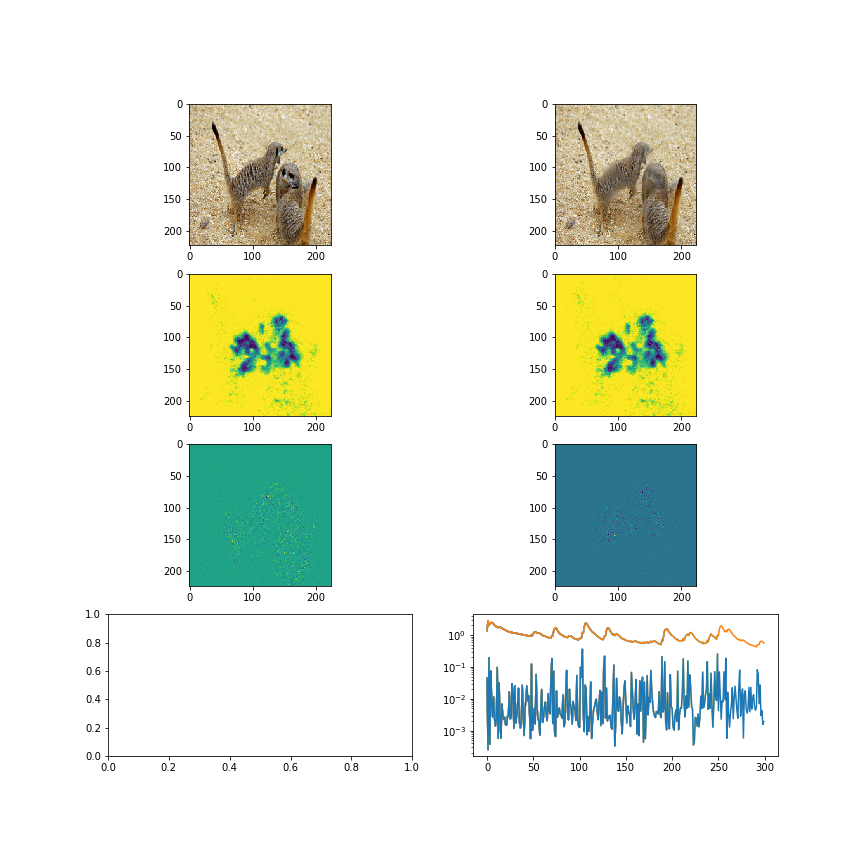

saved mask to /data/ruthfong/neural_coding/pycaffe_results/googlenet_train_heldout_given_grad_1_norm_0/min_top5_prob_avg_blur_blank_noise/lr_-1.00_l1_lambda_-4.00_tv_lambda_-inf_l1_lambda_2_-2.00_beta_3.00_mask_scale_1_blur_mask_0_jitter_4_noise_-inf_num_iters_300_tv2_mask_init/6.npy


<IPython.core.display.Javascript object>


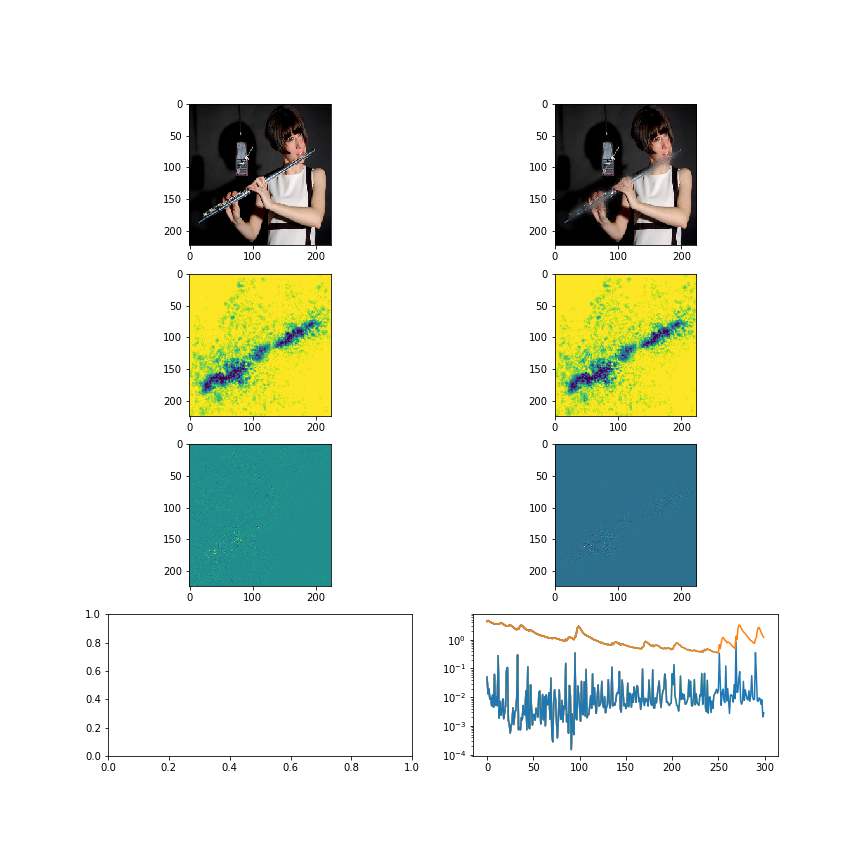

saved mask to /data/ruthfong/neural_coding/pycaffe_results/googlenet_train_heldout_given_grad_1_norm_0/min_top5_prob_avg_blur_blank_noise/lr_-1.00_l1_lambda_-4.00_tv_lambda_-inf_l1_lambda_2_-2.00_beta_3.00_mask_scale_1_blur_mask_0_jitter_4_noise_-inf_num_iters_300_tv2_mask_init/7.npy


<IPython.core.display.Javascript object>


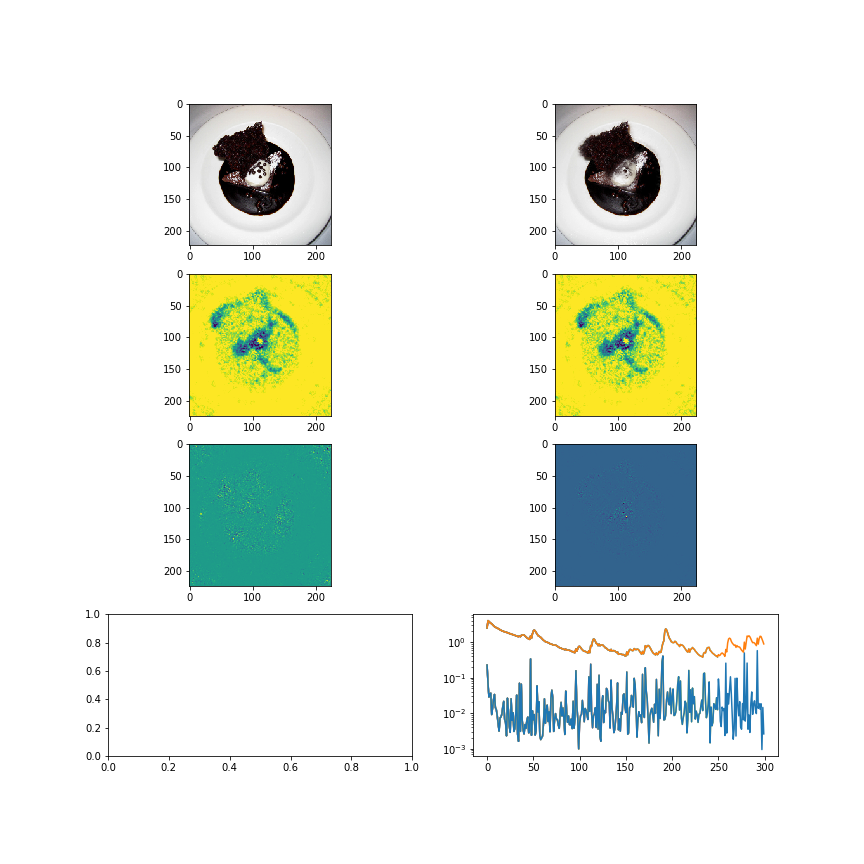

saved mask to /data/ruthfong/neural_coding/pycaffe_results/googlenet_train_heldout_given_grad_1_norm_0/min_top5_prob_avg_blur_blank_noise/lr_-1.00_l1_lambda_-4.00_tv_lambda_-inf_l1_lambda_2_-2.00_beta_3.00_mask_scale_1_blur_mask_0_jitter_4_noise_-inf_num_iters_300_tv2_mask_init/8.npy


<IPython.core.display.Javascript object>


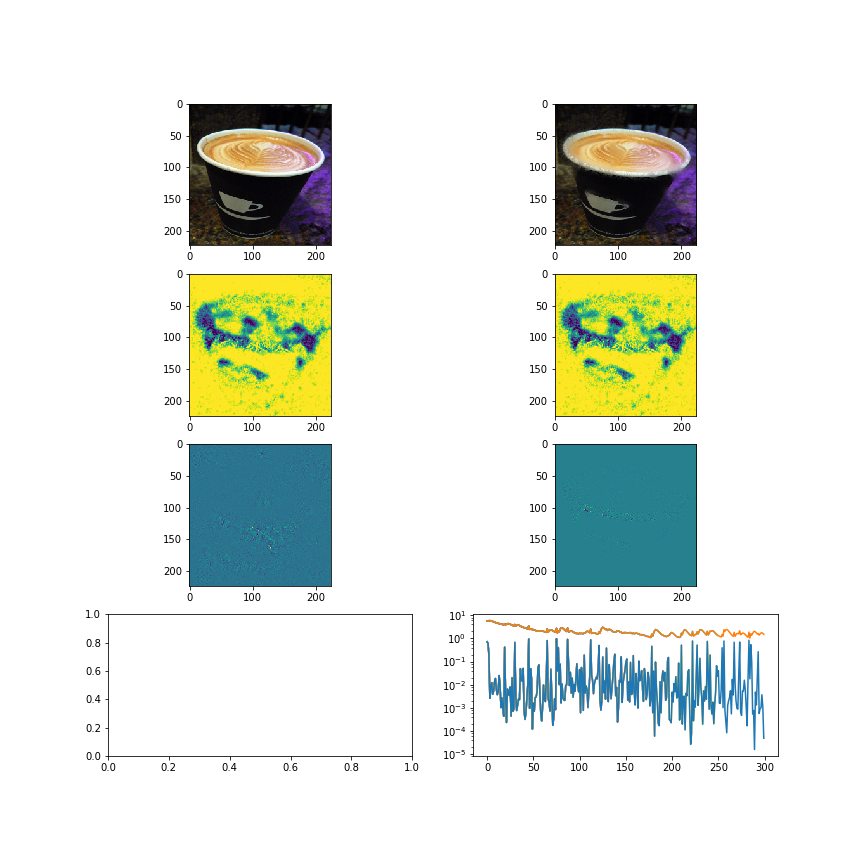

saved mask to /data/ruthfong/neural_coding/pycaffe_results/googlenet_train_heldout_given_grad_1_norm_0/min_top5_prob_avg_blur_blank_noise/lr_-1.00_l1_lambda_-4.00_tv_lambda_-inf_l1_lambda_2_-2.00_beta_3.00_mask_scale_1_blur_mask_0_jitter_4_noise_-inf_num_iters_300_tv2_mask_init/9.npy


<IPython.core.display.Javascript object>


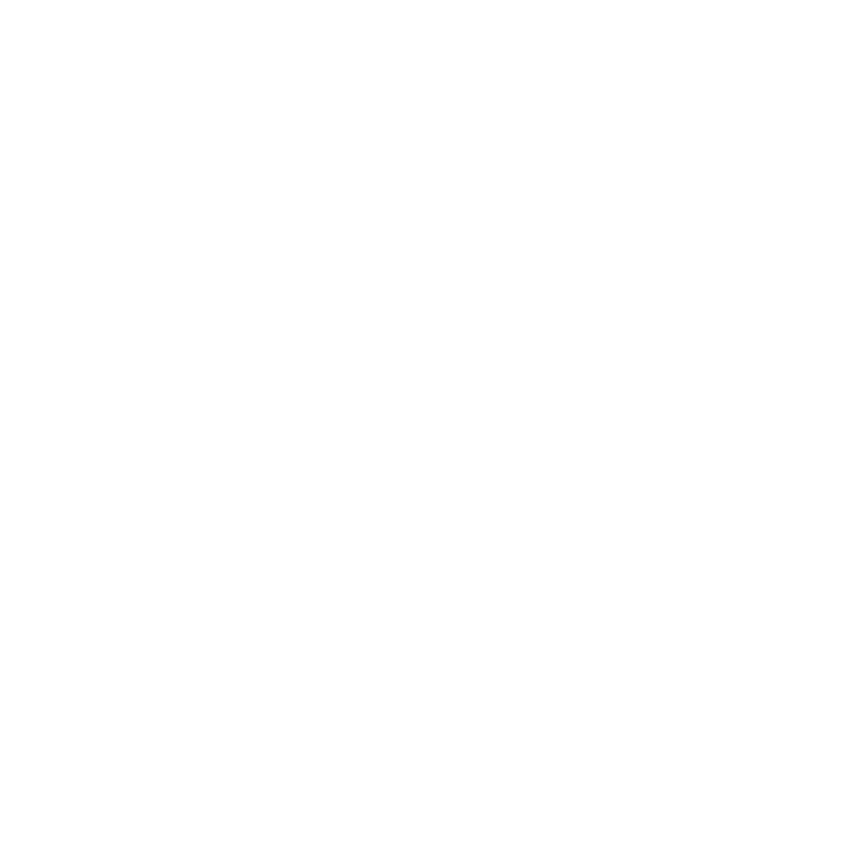

<IPython.core.display.Javascript object>


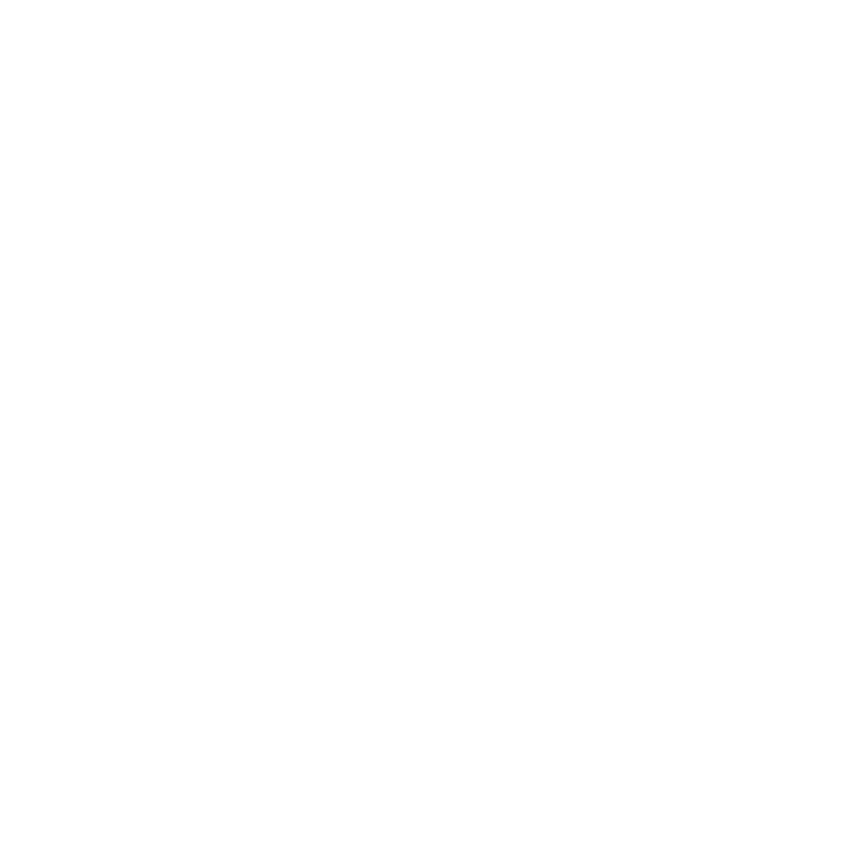

<IPython.core.display.Javascript object>


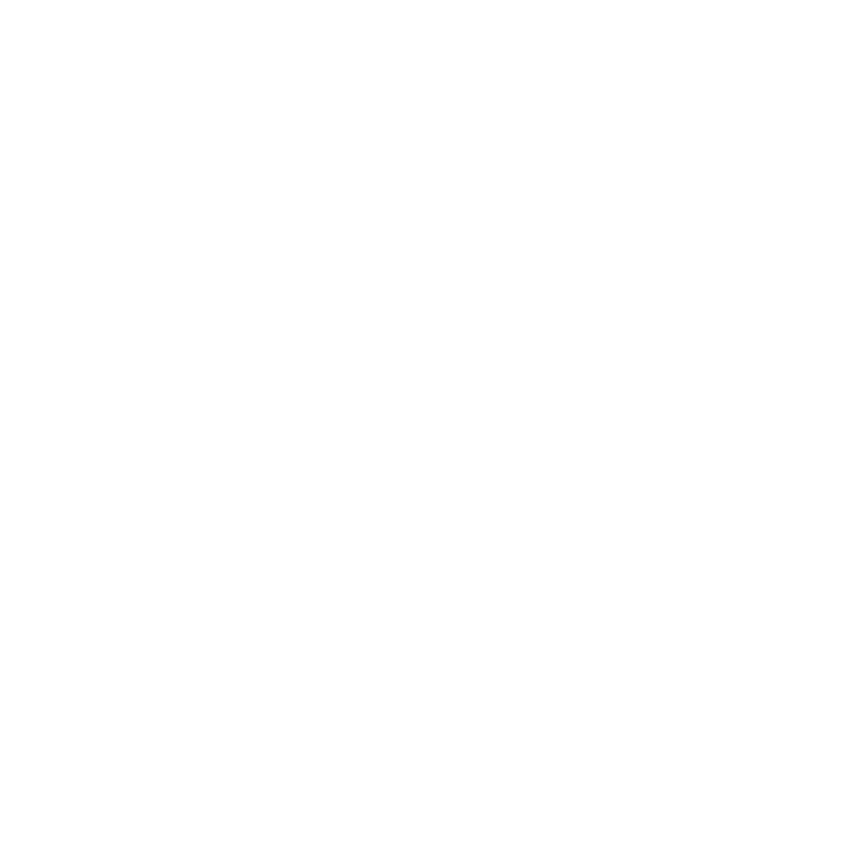

<IPython.core.display.Javascript object>


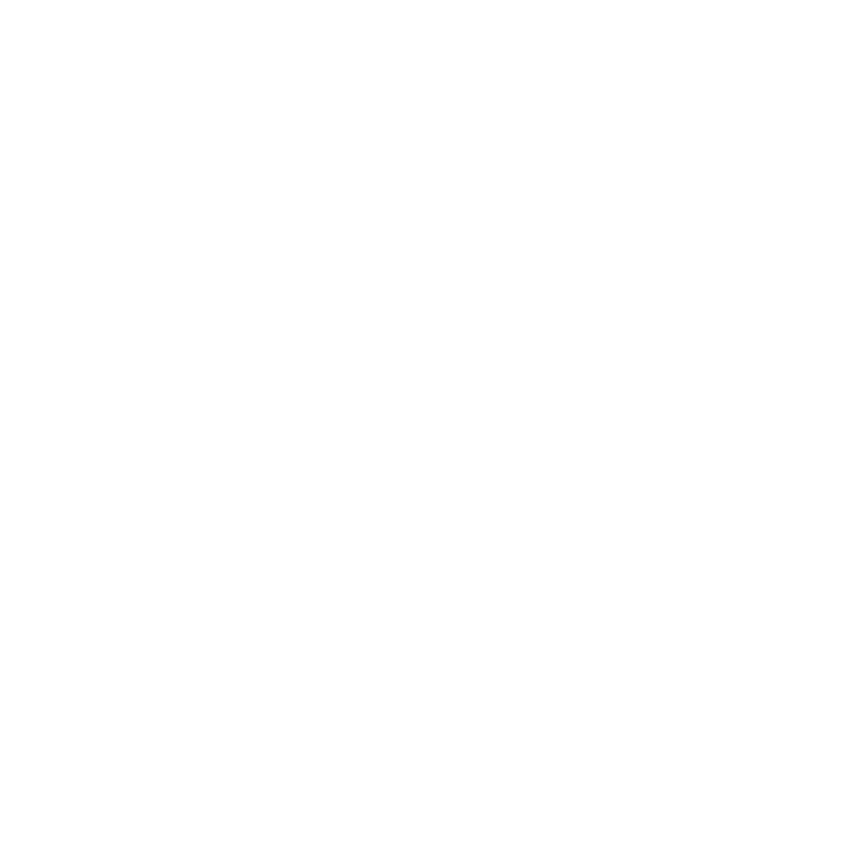

<IPython.core.display.Javascript object>


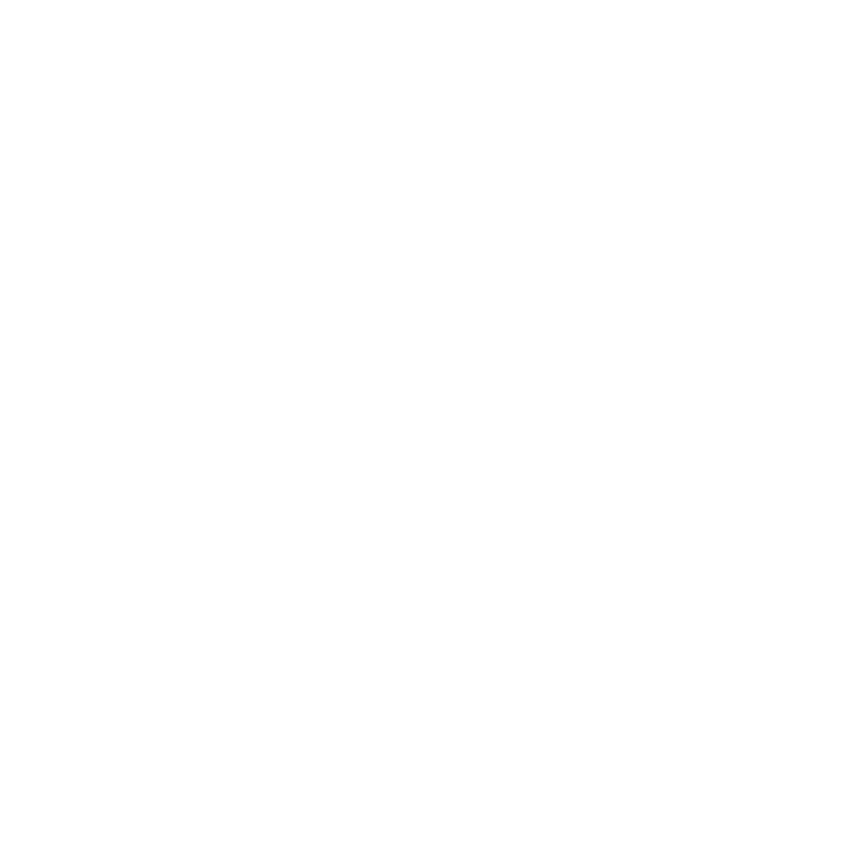

<IPython.core.display.Javascript object>


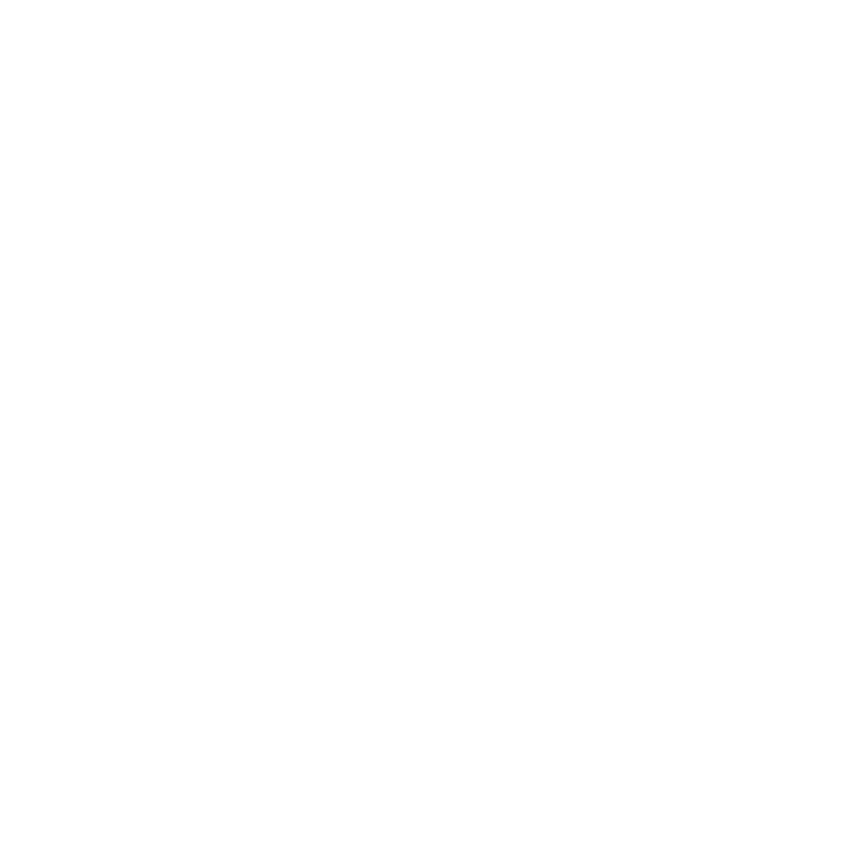

<IPython.core.display.Javascript object>


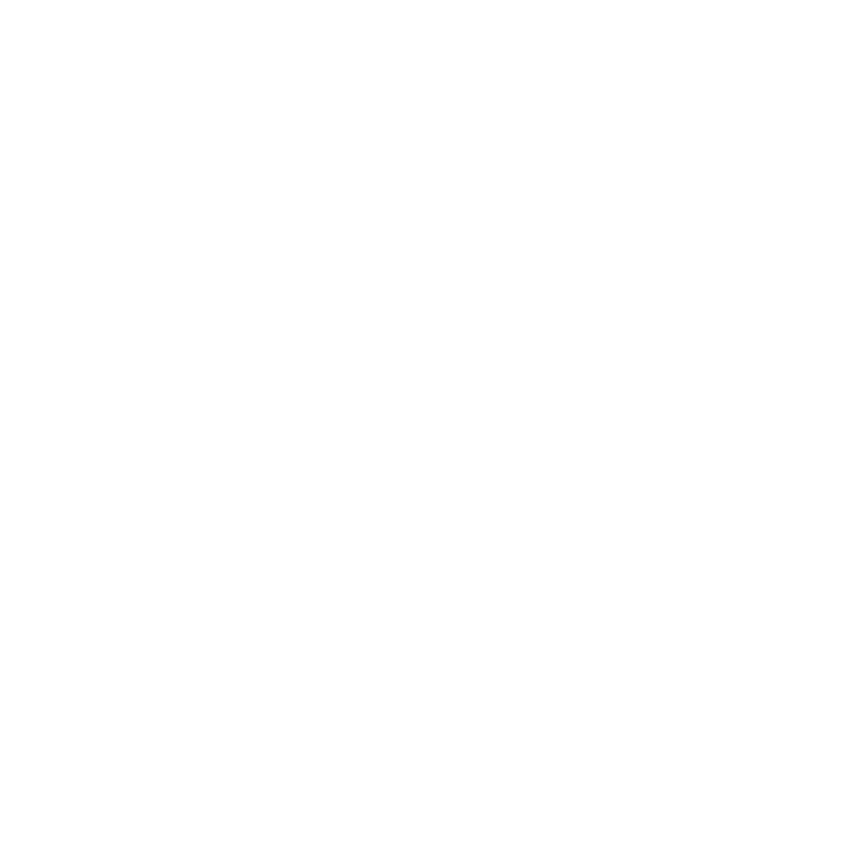

<IPython.core.display.Javascript object>


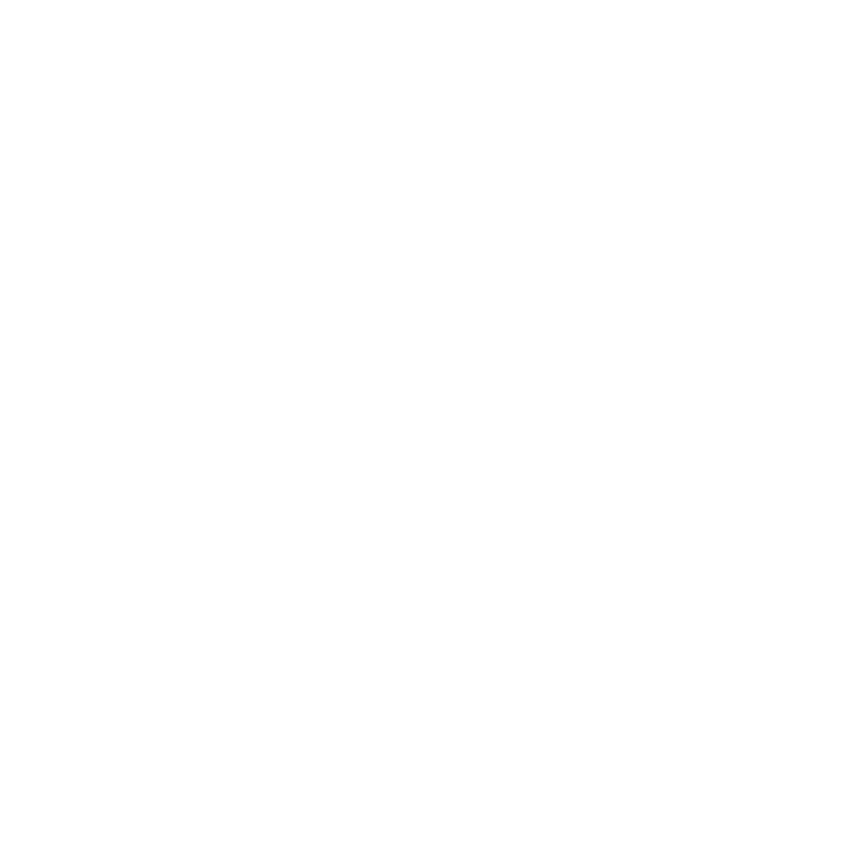

<IPython.core.display.Javascript object>


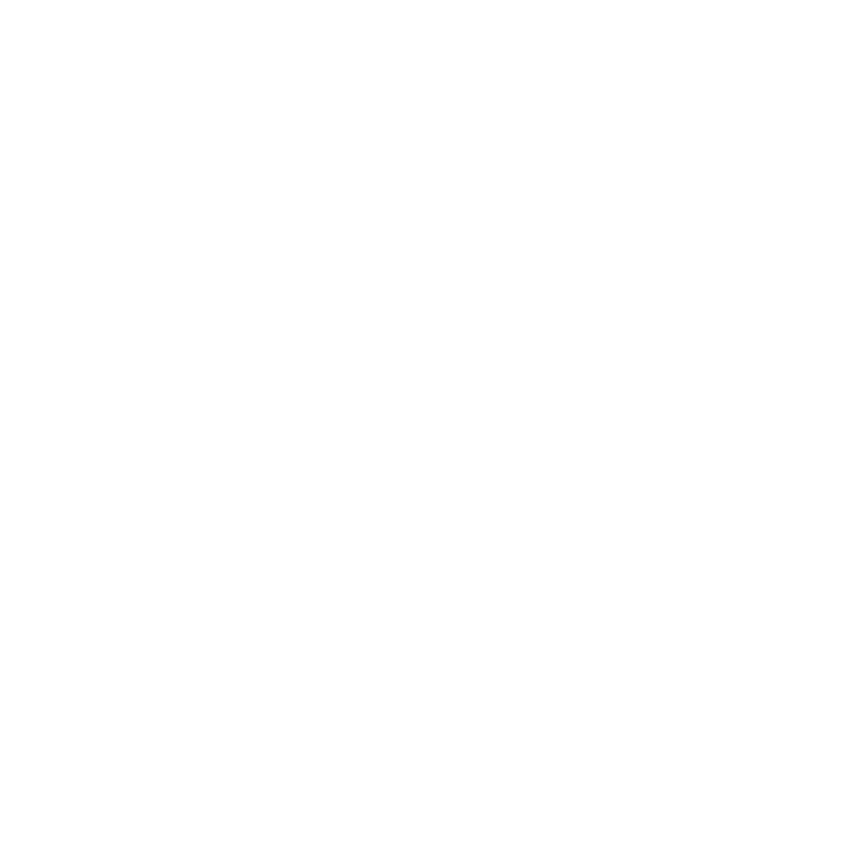

<IPython.core.display.Javascript object>


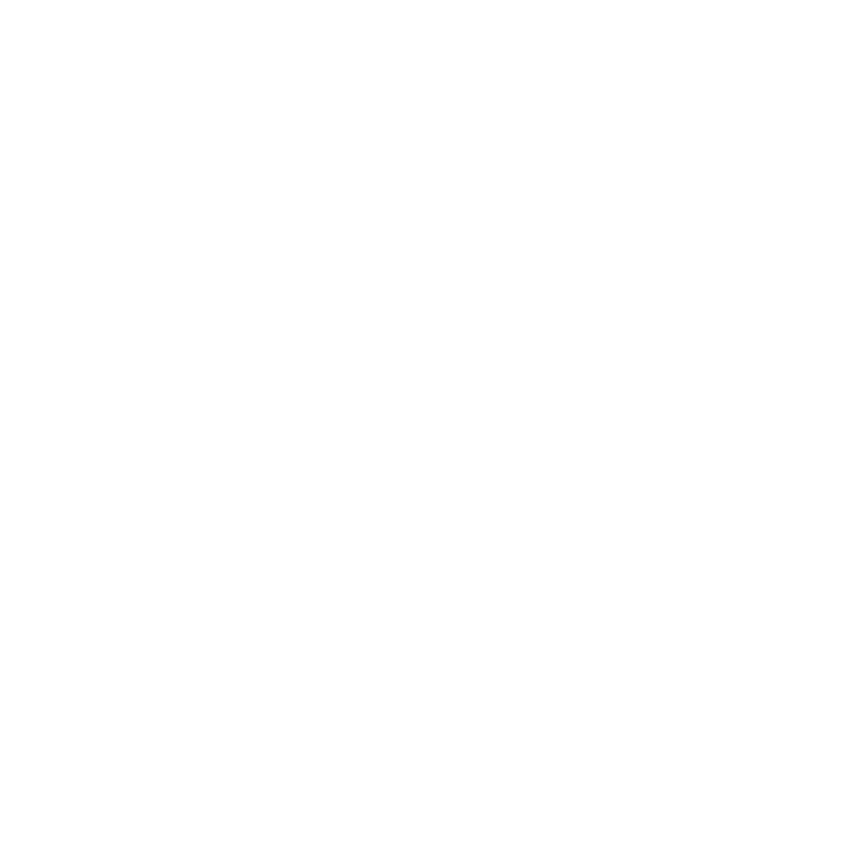

In [29]:
import optimize_mask
reload(optimize_mask)
from optimize_mask import *
data_desc = 'train_heldout'

num_iters = 300
lr = 1e-1
l1_lambda = 1e-4
l1_ideal = 1
l1_lambda_2 = 0
tv_lambda = 1e-2
tv_beta = 3
jitter = 4
num_top = 5
noise = 0
null_type = 'avg_blur_blank_noise'
given_gradient = True
norm_score = False
end_layer = 'prob'
use_conv_norm = False
blur_mask = 0
mask_scale = 1
#mask_init = None

for i in range(10):
    net = get_net(net_type)
    net_transformer = get_ILSVRC_net_transformer(net)

    path = paths[i]
    img = net_transformer.preprocess('data', caffe.io.load_image(path))
    net.blobs['data'].data[...] = img
    net.forward()
    scores = np.squeeze(net.blobs['prob'].data)
    sorted_idx = np.argsort(scores)
    if given_gradient:
        target = np.zeros(scores.shape)
        target[sorted_idx[:-(num_top+1):-1]] = 1
    else:
        target = sorted_idx[:-(num_top+1):-1]

    mask_radius = test_circular_masks(net, paths[i], labels[i], plot = False)
    mask_init = 1-create_blurred_circular_mask((net.blobs['data'].data.shape[2], net.blobs['data'].data.shape[3]), 
                                             mask_radius, center = None, sigma = 10)
    
    fig_path = None
    if i < 100:
        fig_path = os.path.join('/data/ruthfong/neural_coding/pycaffe_figs/%s_%s_given_grad_%d_norm_%d/min_top%d_prob_%s/lr_%.2f_l1_lambda_%.2f_l1_lambda2_%.2f_tv_lambda_%.2f_beta_%.2f_mask_scale_%d_blur_mask_%d_jitter_%d_noise_%.1f_num_iters_%d_tv2_mask_init/%d.png' % (
            net_type, data_desc, int(given_gradient), int(norm_score), num_top, null_type, np.log10(lr), np.log10(l1_lambda), np.log10(l1_lambda_2), np.log10(tv_lambda), tv_beta, mask_scale, blur_mask, jitter, np.log10(noise), num_iters, i))
    mask_path = os.path.join('/data/ruthfong/neural_coding/pycaffe_results/%s_%s_given_grad_%d_norm_%d/min_top%d_prob_%s/lr_%.2f_l1_lambda_%.2f_tv_lambda_%.2f_l1_lambda_2_%.2f_beta_%.2f_mask_scale_%d_blur_mask_%d_jitter_%d_noise_%.1f_num_iters_%d_tv2_mask_init/%d.npy' % (
        net_type, data_desc, int(given_gradient), int(norm_score), num_top, null_type, np.log10(lr), np.log10(l1_lambda), np.log10(l1_lambda_2), np.log10(tv_lambda), tv_beta, mask_scale, blur_mask, jitter, np.log10(noise), num_iters, i))


    #if os.path.exists(mask_path):
    #   print '%s already exists so skipping' % mask_path
    #   continue

    
    optimize_mask(net, path, target, given_gradient = given_gradient, norm_score = norm_score,
                        num_iters = num_iters, lr = lr, l1_lambda = l1_lambda, l1_ideal = 1,
                        l1_lambda_2 = l1_lambda_2, tv_lambda = tv_lambda, tv_beta = tv_beta, mask_scale = mask_scale,
                        use_conv_norm= use_conv_norm, blur_mask = blur_mask, jitter = jitter,
                        null_type = null_type, mask_init = mask_init, gpu = gpu, start_layer = None, end_layer = None,
                        plot_step = 50, debug = False, fig_path = fig_path, mask_path = mask_path)

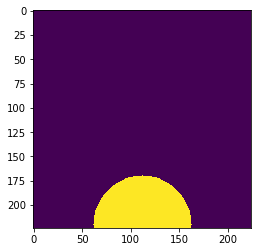

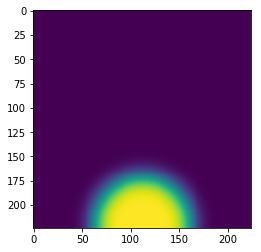

In [126]:
a, b = 220, 112
n = 224
r = 50

y,x = np.ogrid[-a:n-a, -b:n-b]
mask = x*x + y*y <= r*r

array = np.zeros((n, n))
array[mask] = 1

plt.imshow(array)
plt.show()

plt.imshow(scipy.ndimage.filters.gaussian_filter(array, 10))
plt.show()


(10, 10, 10, 10)


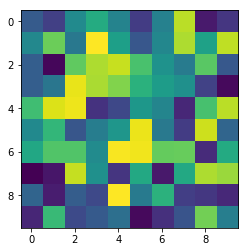

In [10]:
mask = np.random.random((10,10))
print 2*mask.shape
plt.imshow(mask)
plt.show()

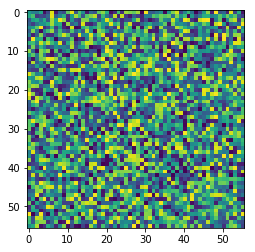

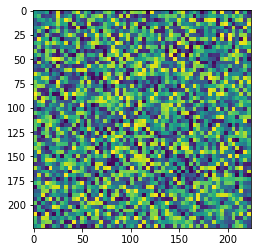

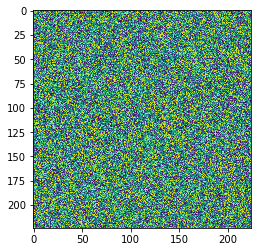

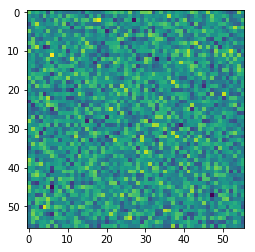

In [60]:
def resize(img, scale, interp = 'nearest', diff = False):
    assert(len(img.shape) == 2)
    assert(interp == 'nearest')
    if diff:
        assert(int(img.shape[0]/float(scale)) == img.shape[0]/float(scale))
        assert(int(img.shape[1]/float(scale)) == img.shape[1]/float(scale))
        img_ = np.zeros((img.shape[0]/scale, img.shape[1]/scale))
    else:
        assert(int(scale) == scale)
        img_ = np.zeros((scale*img.shape[0], scale*img.shape[1]))
    
    for i in range(img_.shape[0]):
        for j in range(img_.shape[1]):
            if diff:
                for r in range(scale):
                    for c in range(scale):
                        img_[i][j] += img[i*scale+r][j*scale+c]
            else:
                img_[i][j] = img[int(i/scale)][int(j/scale)]
    return img_

mask = np.random.random((56,56))
plt.imshow(mask)
plt.show()

new_mask = resize(mask, 4)
plt.imshow(new_mask)
plt.show()

large_mask = np.random.random((224,224))
plt.imshow(large_mask)
plt.show()

mask_der = resize(large_mask, 4, diff = True)
plt.imshow(mask_der)
plt.show()